In [5]:
import cv2
import numpy as np
import scipy.io as sio
import matplotlib.pyplot as plt
from sklearn.neighbors import NearestNeighbors
from scipy import interpolate

In [6]:
def find_match(img1, img2):

    # To do

    print('1. Result of find match input')
    print('img1:')
    print(img1)
    print(type(img1))
    print(img1.shape)
    print('img2:')
    print(img2)
    print(type(img2))
    print(img2.shape)

    x1 = []
    x2 = []

    template = img1
    target = img2

    sift = cv2.SIFT_create()

    kp_temp, des_temp = sift.detectAndCompute(template, None)
    kp_coordinates_temp = [keypoint.pt for keypoint in kp_temp]

    kp_target, des_target = sift.detectAndCompute(target, None)
    kp_coordinates_target = [keypoint.pt for keypoint in kp_target]

    for one_des_temp, one_kp_cd in zip(des_temp, kp_coordinates_temp):

        combined_des = np.append([one_des_temp], des_target, axis=0)

        nbrs = NearestNeighbors(n_neighbors=3).fit(combined_des)

        distances, indices = nbrs.kneighbors(combined_des)

        first_nbr_idx = indices[0][1]

        first_nbr_dist = distances[0][1]
        second_nbr_dist = distances[0][2]     

        
        if first_nbr_dist/second_nbr_dist < 0.7:
            x1.append([one_kp_cd[0], one_kp_cd[1]])
            x2.append([kp_coordinates_target[first_nbr_idx-1][0],
                       kp_coordinates_target[first_nbr_idx-1][1]])
            
        
    x1 = np.array(x1)
    x2 = np.array(x2)

    print('1. Result of find match output')
    print('x1:')
    print(x1)
    print(type(x1))
    print(x1.shape)
    print('x2:')
    print(x2)
    print(type(x2))
    print(x2.shape)

    return x1, x2





def align_image_using_feature(x1, x2, ransac_thr, ransac_iter):

    # To do


    print('2. allign_image_using_features input')
    print('x1:')
    print(x1)
    print(type(x1))
    print(x1.shape)
    print('x2:')
    print(x2)
    print(type(x2))
    print(x2.shape)
    print('ransac_thr:')
    print(ransac_thr)
    print(type(ransac_thr))
    print('ransac_iter:')
    print(ransac_iter)
    print(type(ransac_iter))

    x1_for_affine = []

    for i in x1:
        x1_for_affine.append([i[0], i[1], 1])
    
    x1_for_affine = np.array(x1_for_affine)

    nums_inliers = []
    coeffs_list = []

    for num_iter in range(ransac_iter):

        xs_temp = []
        xs_target = []
        ys_temp = []
        ys_target = []

        randints = np.random.randint(0, len(x1), 3)

        x1_sampled = x1[randints]
        x2_sampled = x2[randints]


        for one_x1, one_x2 in zip(x1_sampled, x2_sampled):

            x_temp = one_x1[0]
            y_temp = one_x1[1]

            x_target = one_x2[0]
            y_target = one_x2[1]


            xs_temp.append(x_temp)
            xs_target.append(x_target)

            ys_temp.append(y_temp)
            ys_target.append(y_target)


        xs_temp = np.array(xs_temp)
        xs_target = np.array(xs_target)
        ys_temp = np.array(ys_temp)
        ys_target = np.array(ys_target)


        A_x = np.vstack([xs_temp, np.ones(len(xs_temp))]).T
        m_x, c_x = np.linalg.lstsq(A_x, xs_target, rcond=None)[0]

        A_y = np.vstack([ys_temp, np.ones(len(ys_temp))]).T
        m_y, c_y = np.linalg.lstsq(A_y, ys_target, rcond=None)[0]

        
        inliers_temp = []
        inliers_target = [] 

        for one_cd_temp, one_cd_target in zip(x1, x2):
            
            d_x_from_line = abs(one_cd_target[0]-m_x*one_cd_temp[0]-c_x)
            d_y_from_line  = abs(one_cd_target[1]-m_y*one_cd_temp[1]-c_y)

            if d_x_from_line < ransac_thr and d_y_from_line < ransac_thr:

                inliers_temp.append(one_cd_temp)
                inliers_target.append(one_cd_target)
        

        num_inlier = len(inliers_temp)

        nums_inliers.append(num_inlier)
        coeffs_list.append([m_x, c_x, m_y, c_y])

        inliers_temp = np.array(inliers_temp)
        inliers_target = np.array(inliers_target)


    idx_max_inliners = np.argmax(nums_inliers)
    m_x, c_x, m_y, c_y = coeffs_list[idx_max_inliners]


    inliers_temp = []
    inliers_target = [] 

    for one_cd_temp, one_cd_target in zip(x1, x2):
        
        d_x_from_line = abs(one_cd_target[0]-m_x*one_cd_temp[0]-c_x)
        d_y_from_line  = abs(one_cd_target[1]-m_y*one_cd_temp[1]-c_y)


        if d_x_from_line < ransac_thr and d_y_from_line < ransac_thr:

            inliers_temp.append(one_cd_temp)
            inliers_target.append(one_cd_target)
   

    inliers_temp = np.array(inliers_temp)
    inliers_target = np.array(inliers_target)
    

    inliers_temp = np.array(list(map(lambda x: [x[0], x[1], 1], inliers_temp)))
    inliers_target = np.array(list(map(lambda x: [x[0], x[1], 1], inliers_target)))



    A = np.linalg.inv(np.transpose(inliers_temp)@inliers_temp)@np.transpose(inliers_temp)@inliers_target

    A = np.transpose(A)

    print('2. allign_image_using_features output')
    print('A:')
    print(A)
    print(type(A))
    print(A.shape)

    return A




def warp_image(img, A, output_size):

    # To do

    print('3. img_warped input')
    print('img:')
    print(img)
    print(type(img))
    print(img.shape)
    print('A:')
    print(A)
    print(type(A))
    print(A.shape)
    print('output_size:')
    print(output_size)
    print(type(output_size))

    # Vectorize the creation of coordinates
    y_indices, x_indices = np.indices((img.shape[0], img.shape[1]))
    img_cds = np.stack([x_indices, y_indices, np.ones_like(x_indices)], axis=-1).reshape(-1, 3).T

    # Apply the transformation
    inversed_cds = np.linalg.inv(A) @ img_cds

    # Round the coordinates and clip to valid indices
    inversed_cds = np.round(inversed_cds).astype(int)
    valid_indices = (inversed_cds[0] >= 0) & (inversed_cds[0] < output_size[1]) & \
                    (inversed_cds[1] >= 0) & (inversed_cds[1] < output_size[0])

    # Create an empty image with the desired output size
    img_warped = np.zeros(output_size)

    # Use advanced indexing to map the valid coordinates
    img_warped[inversed_cds[1][valid_indices], inversed_cds[0][valid_indices]] = img[img_cds[1][valid_indices], img_cds[0][valid_indices]]

    # Check if interpolation is needed
    if np.any(img_warped == 0):

        # Interpolate only the zero values
        zero_indices = np.stack(np.nonzero(img_warped == 0), axis=-1)
        non_zero_indices = np.stack(np.nonzero(img_warped), axis=-1)
        img_warped[img_warped == 0] = interpolate.griddata(
            non_zero_indices, img_warped[img_warped != 0],
            zero_indices, method='nearest'
        )

    print('3. img_warped output')
    print('img_warped:')
    print(img_warped)
    print(type(img_warped))
    print(img_warped.shape)

    print('visualization for checking warpred function...')
    plt.imshow(img_warped)
    plt.show()
        
    return img_warped



def align_image(template, target, A):

    print('4. Inverse Compositional Image Alignment input')
    print('template:')
    print(template)
    print(type(template))
    print(template.shape)
    print('target:')
    print(target)
    print(type(target))
    print(target.shape)
    print('A:')
    print(A)
    print(type(A))
    print(A.shape)


    # -----------------------------------------------------------------------------
    # --------------- Implementation of Sobel filter ------------------------------

    Gx = np.array([[-1.0, 0.0, 1.0], [-2.0, 0.0, 2.0], [-1.0, 0.0, 1.0]])
    Gy = np.array([[-1.0, -2.0, -1.0], [0.0, 0.0, 0.0], [1.0, 2.0, 1.0]])

    [rows, columns] = np.shape(template)  # we need to know the shape of the input grayscale image

    padded_template = np.pad(template, (1, 1), 'edge')

    # Now we "sweep" the image in both x and y directions and compute the output
    gx = np.zeros(shape=(rows, columns))
    gy = np.zeros(shape=(rows, columns))

    for i in range(0, padded_template.shape[0]-2):
        for j in range(0, padded_template.shape[1]-2):
            gx[i][j] = np.sum(np.multiply(Gx, padded_template[i:i + 3, j:j + 3]))  # x direction
            gy[i][j] = np.sum(np.multiply(Gy, padded_template[i:i + 3, j:j + 3]))  # y direction


    # value multiplied to derivatives change 
    # the performance and speed of the codes.
    gx = gx*1/100
    gy = gy*1/100
    
    # Some data manipulation for better performance
    for i in range(gx.shape[0]):
        gx[i][0] = 0
        gx[i][-1] = 0

    for i in range(gy.shape[1]):
        gy[0][i] = 0
        gy[-1][i] = 0
    # -----------------------------------------------------------------------------
    # -----------------------------------------------------------------------------   


    # -----------------------------------------------------------------------------
    # --------- Implementation of Inverse Compositional Images Alignment ----------
        
    # Compute indices (i_x, i_y) as grids
    Ix, Iy = np.meshgrid(np.arange(template.shape[1]), np.arange(template.shape[0]))

    # Vectorize computation of matrix D
    D = np.stack([gx * Ix, gx * Iy, gx, gy * Ix, gy * Iy, gy], axis=-1)
    
    # Initialize H as a zero matrix
    H = np.zeros((6, 6))
    for d in D.reshape(-1, 6):
        H += np.outer(d, d)
    
    num_itr = 0 
    errors_list = []

    while True:
        # Warp the image with the current estimate of A
        warped_img = warp_image(target, A, template.shape)
        
        if num_itr%5==0:
            
            plt.imshow(warped_img, cmap='gray')
            plt.show()

        # Compute the error image
        error = warped_img - template

        # Vectorize computation of matrix F
        F = np.einsum('ij,ijk->k', error, D)
        
        # Compute change in parameters
        change_p, _, _, _ = np.linalg.lstsq(H, F, rcond=None)
        
        # Update the transformation matrix A
        change_A = np.array([[1+change_p[0], change_p[1], change_p[2]],
                             [change_p[3], 1+change_p[4], change_p[5]],
                             [0, 0, 1]])
        
        # Compute the norm of the error
        norm_error = np.linalg.norm(error)
    
        num_itr += 1

        print('Magnitude of required change of A is:', norm_error)
        print('Number of iterations:', num_itr)

        errors_list.append(norm_error)

        # Check for convergence
        if num_itr > 10 or norm_error < 10000:
            break
    
        else:
            A = A @ np.linalg.inv(change_A)

    # -----------------------------------------------------------------------------
    # -----------------------------------------------------------------------------   
    
    A_refined = A
    errors = np.array(errors_list)

    print('4. Inverse Compositional Image Alignment output')
    print('refined A:')
    print(A_refined)
    print(type(A_refined))
    print(A_refined.shape)

    return A_refined, errors
    



def track_multi_frames(template, img_list):

    # To do         

    print('5. track_multi_frames input')
    print('template:')
    print(template)
    print(type(template))
    print(template.shape)
    print('img_list:')
    print(img_list)
    print(type(img_list))
    print(len(img_list))

   
    x1, x2 = find_match(template, target_list[0])

    ransac_thr = 150
    ransac_iter = 5

    A = align_image_using_feature(x1, x2, ransac_thr, ransac_iter)

    A_list = []

    for i in img_list:

        A_refined, error = align_image(template, i, A)
        visualize_align_image(template, i, A, A_refined, error)

        A_list.append(A_refined)

    print('5. track_multi_frames output')

    print('A_list:')
    print(A_list)
    print(type(A_list))
    print(len(A_list))


    return A_list


def visualize_find_match(img1, img2, x1, x2, img_h=500):
    assert x1.shape == x2.shape, 'x1 and x2 should have same shape!'
    scale_factor1 = img_h/img1.shape[0]
    scale_factor2 = img_h/img2.shape[0]
    img1_resized = cv2.resize(img1, None, fx=scale_factor1, fy=scale_factor1)
    img2_resized = cv2.resize(img2, None, fx=scale_factor2, fy=scale_factor2)
    x1 = x1 * scale_factor1
    x2 = x2 * scale_factor2
    x2[:, 0] += img1_resized.shape[1]
    img = np.hstack((img1_resized, img2_resized))
    plt.imshow(img, cmap='gray', vmin=0, vmax=255)
    for i in range(x1.shape[0]):
        plt.plot([x1[i, 0], x2[i, 0]], [x1[i, 1], x2[i, 1]], 'b')
        plt.plot([x1[i, 0], x2[i, 0]], [x1[i, 1], x2[i, 1]], 'bo')
    plt.axis('off')
    plt.show()


def visualize_align_image_using_feature(img1, img2, x1, x2, A, ransac_thr, img_h=500):
    x2_t = np.hstack((x1, np.ones((x1.shape[0], 1)))) @ A.T
    errors = np.sum(np.square(x2_t[:, :2] - x2), axis=1)
    mask_inliers = errors < ransac_thr
    boundary_t = np.hstack(( np.array([[0, 0], [img1.shape[1], 0], [img1.shape[1], img1.shape[0]], [0, img1.shape[0]], [0, 0]]), np.ones((5, 1)) )) @ A[:2, :].T

    scale_factor1 = img_h/img1.shape[0]
    scale_factor2 = img_h/img2.shape[0]
    img1_resized = cv2.resize(img1, None, fx=scale_factor1, fy=scale_factor1)
    img2_resized = cv2.resize(img2, None, fx=scale_factor2, fy=scale_factor2)
    x1 = x1 * scale_factor1
    x2 = x2 * scale_factor2
    x2[:, 0] += img1_resized.shape[1]
    img = np.hstack((img1_resized, img2_resized))
    plt.imshow(img, cmap='gray', vmin=0, vmax=255)

    boundary_t = boundary_t * scale_factor2
    boundary_t[:, 0] += img1_resized.shape[1]
    plt.plot(boundary_t[:, 0], boundary_t[:, 1], 'y')
    for i in range(x1.shape[0]):
        if mask_inliers[i]:
            plt.plot([x1[i, 0], x2[i, 0]], [x1[i, 1], x2[i, 1]], 'g')
            plt.plot([x1[i, 0], x2[i, 0]], [x1[i, 1], x2[i, 1]], 'go')
        else:
            plt.plot([x1[i, 0], x2[i, 0]], [x1[i, 1], x2[i, 1]], 'r')
            plt.plot([x1[i, 0], x2[i, 0]], [x1[i, 1], x2[i, 1]], 'ro')
    
    plt.show()

def visualize_align_image(template, target, A, A_refined, errors=None):
    img_warped_init = warp_image(target, A, template.shape)
    img_warped_optim = warp_image(target, A_refined, template.shape)
    err_img_init = np.abs(img_warped_init - template)
    err_img_optim = np.abs(img_warped_optim - template)
    img_warped_init = np.uint8(img_warped_init)
    img_warped_optim = np.uint8(img_warped_optim)
    overlay_init = cv2.addWeighted(template, 0.5, img_warped_init, 0.5, 0)
    overlay_optim = cv2.addWeighted(template, 0.5, img_warped_optim, 0.5, 0)
    plt.subplot(241)
    plt.imshow(template, cmap='gray')
    plt.title('Template')
    plt.axis('off')
    plt.subplot(242)
    plt.imshow(img_warped_init, cmap='gray')
    plt.title('Initial warp')
    plt.axis('off')
    plt.subplot(243)
    plt.imshow(overlay_init, cmap='gray')
    plt.title('Overlay')
    plt.axis('off')
    plt.subplot(244)
    plt.imshow(err_img_init, cmap='jet')
    plt.title('Error map')
    plt.axis('off')
    plt.subplot(245)
    plt.imshow(template, cmap='gray')
    plt.title('Template')
    plt.axis('off')
    plt.subplot(246)
    plt.imshow(img_warped_optim, cmap='gray')
    plt.title('Opt. warp')
    plt.axis('off')
    plt.subplot(247)
    plt.imshow(overlay_optim, cmap='gray')
    plt.title('Overlay')
    plt.axis('off')
    plt.subplot(248)
    plt.imshow(err_img_optim, cmap='jet')
    plt.title('Error map')
    plt.axis('off')
    plt.show()

    if errors is not None:
        plt.plot(errors * 255)
        plt.xlabel('Iteration')
        plt.ylabel('Error')
        plt.show()


def visualize_track_multi_frames(template, img_list, A_list):
    bbox_list = []
    for A in A_list:
        boundary_t = np.hstack((np.array([[0, 0], [template.shape[1], 0], [template.shape[1], template.shape[0]],
                                        [0, template.shape[0]], [0, 0]]), np.ones((5, 1)))) @ A[:2, :].T
        bbox_list.append(boundary_t)

    plt.subplot(221)
    plt.imshow(img_list[0], cmap='gray')
    plt.plot(bbox_list[0][:, 0], bbox_list[0][:, 1], 'r')
    plt.title('Frame 1')
    plt.axis('off')
    plt.subplot(222)
    plt.imshow(img_list[1], cmap='gray')
    plt.plot(bbox_list[1][:, 0], bbox_list[1][:, 1], 'r')
    plt.title('Frame 2')
    plt.axis('off')
    plt.subplot(223)
    plt.imshow(img_list[2], cmap='gray')
    plt.plot(bbox_list[2][:, 0], bbox_list[2][:, 1], 'r')
    plt.title('Frame 3')
    plt.axis('off')
    plt.subplot(224)
    plt.imshow(img_list[3], cmap='gray')
    plt.plot(bbox_list[3][:, 0], bbox_list[3][:, 1], 'r')
    plt.title('Frame 4')
    plt.axis('off')
    plt.show()

1. Result of find match input
img1:
[[213 213 213 ... 179 180 181]
 [213 213 213 ... 179 180 182]
 [213 213 213 ... 179 180 181]
 ...
 [107 106 104 ... 191 190 192]
 [108 106 104 ... 191 191 192]
 [109 107 105 ... 191 191 193]]
<class 'numpy.ndarray'>
(1068, 777)
img2:
[[178 177 177 ... 125 125 125]
 [177 177 177 ... 125 125 125]
 [177 177 176 ... 125 125 125]
 ...
 [ 10  10  11 ...  46  47  47]
 [ 10  11  11 ...  47  47  48]
 [ 11  11  11 ...  47  48  48]]
<class 'numpy.ndarray'>
(1936, 2904)
1. Result of find match output
x1:
[[  25.90970802  562.21783447]
 [  48.43566513  447.19522095]
 [  55.41837311  623.36639404]
 [  63.85661316  586.11682129]
 [  81.31974792  673.99725342]
 [ 101.53504181  548.81713867]
 [ 111.18462372  649.340271  ]
 [ 116.5568924  1018.13555908]
 [ 118.4623642   681.41363525]
 [ 126.048172    113.1996994 ]
 [ 131.73649597  554.48413086]
 [ 139.58195496  672.17559814]
 [ 150.44793701  445.42349243]
 [ 166.17027283 1024.14172363]
 [ 230.25559998  439.09072876]
 

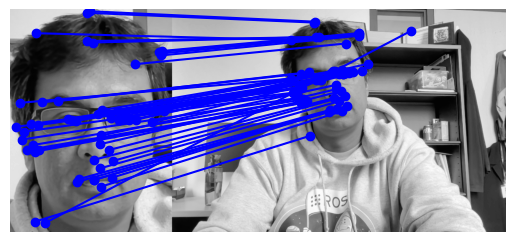

2. allign_image_using_features input
x1:
[[  25.90970802  562.21783447]
 [  48.43566513  447.19522095]
 [  55.41837311  623.36639404]
 [  63.85661316  586.11682129]
 [  81.31974792  673.99725342]
 [ 101.53504181  548.81713867]
 [ 111.18462372  649.340271  ]
 [ 116.5568924  1018.13555908]
 [ 118.4623642   681.41363525]
 [ 126.048172    113.1996994 ]
 [ 131.73649597  554.48413086]
 [ 139.58195496  672.17559814]
 [ 150.44793701  445.42349243]
 [ 166.17027283 1024.14172363]
 [ 230.25559998  439.09072876]
 [ 276.46002197  523.68078613]
 [ 298.40396118  531.73638916]
 [ 316.7539978   533.60430908]
 [ 320.70254517  826.31054688]
 [ 331.45498657  812.28912354]
 [ 367.77001953  151.08937073]
 [ 370.52676392   15.39807606]
 [ 382.64526367    8.02057552]
 [ 399.48464966  157.92056274]
 [ 399.75570679  720.9911499 ]
 [ 400.53292847  817.4017334 ]
 [ 400.53292847  817.4017334 ]
 [ 421.38696289  499.31933594]
 [ 430.74731445  761.68847656]
 [ 430.81820679  645.85528564]
 [ 436.30383301  849.21636963

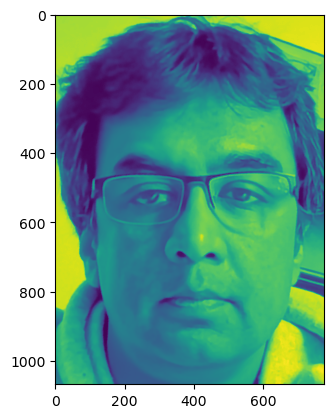

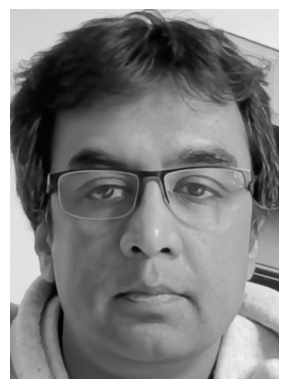

4. Inverse Compositional Image Alignment input
template:
[[213 213 213 ... 179 180 181]
 [213 213 213 ... 179 180 182]
 [213 213 213 ... 179 180 181]
 ...
 [107 106 104 ... 191 190 192]
 [108 106 104 ... 191 191 192]
 [109 107 105 ... 191 191 193]]
<class 'numpy.ndarray'>
(1068, 777)
target:
[[178 177 177 ... 125 125 125]
 [177 177 177 ... 125 125 125]
 [177 177 176 ... 125 125 125]
 ...
 [ 10  10  11 ...  46  47  47]
 [ 10  11  11 ...  47  47  48]
 [ 11  11  11 ...  47  48  48]]
<class 'numpy.ndarray'>
(1936, 2904)
A:
[[ 9.37761086e-01  2.10698689e-01  8.88832688e+02]
 [-2.38143347e-01  9.40170628e-01  1.89267407e+02]
 [ 8.13151629e-19 -8.13151629e-19  1.00000000e+00]]
<class 'numpy.ndarray'>
(3, 3)
3. img_warped input
img:
[[178 177 177 ... 125 125 125]
 [177 177 177 ... 125 125 125]
 [177 177 176 ... 125 125 125]
 ...
 [ 10  10  11 ...  46  47  47]
 [ 10  11  11 ...  47  47  48]
 [ 11  11  11 ...  47  48  48]]
<class 'numpy.ndarray'>
(1936, 2904)
A:
[[ 9.37761086e-01  2.10698689e-01

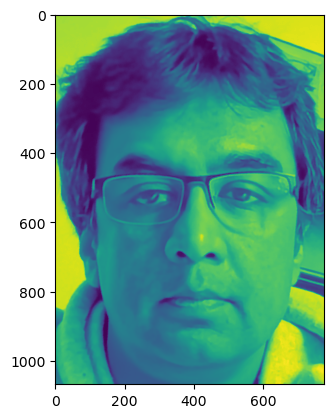

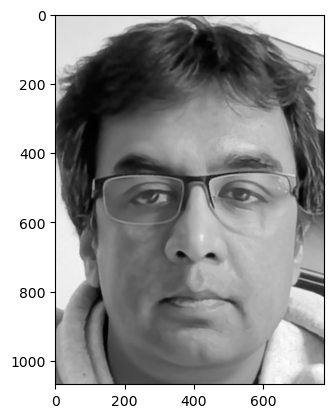

Magnitude of required change of A is: 29049.735265575142
Number of iterations: 1
3. img_warped input
img:
[[178 177 177 ... 125 125 125]
 [177 177 177 ... 125 125 125]
 [177 177 176 ... 125 125 125]
 ...
 [ 10  10  11 ...  46  47  47]
 [ 10  11  11 ...  47  47  48]
 [ 11  11  11 ...  47  48  48]]
<class 'numpy.ndarray'>
(1936, 2904)
A:
[[ 9.46204457e-01  2.24049455e-01  8.86808616e+02]
 [-2.17129425e-01  9.47105427e-01  1.66699022e+02]
 [ 7.97264241e-19 -8.11922726e-19  1.00000000e+00]]
<class 'numpy.ndarray'>
(3, 3)
output_size:
(1068, 777)
<class 'tuple'>
3. img_warped output
img_warped:
[[204. 205. 205. ... 227. 227. 227.]
 [205. 205. 205. ... 227. 227. 227.]
 [205. 205. 204. ... 227. 227. 227.]
 ...
 [115. 125. 132. ... 210. 210. 210.]
 [116. 125. 134. ... 210. 210. 209.]
 [112. 119. 129. ... 211. 210. 209.]]
<class 'numpy.ndarray'>
(1068, 777)
visualization for checking warpred function...


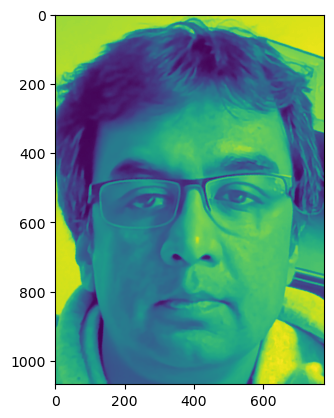

Magnitude of required change of A is: 32196.371457044657
Number of iterations: 2
3. img_warped input
img:
[[178 177 177 ... 125 125 125]
 [177 177 177 ... 125 125 125]
 [177 177 176 ... 125 125 125]
 ...
 [ 10  10  11 ...  46  47  47]
 [ 10  11  11 ...  47  47  48]
 [ 11  11  11 ...  47  48  48]]
<class 'numpy.ndarray'>
(1936, 2904)
A:
[[ 9.67863523e-01  1.96291056e-01  8.85240640e+02]
 [-2.49271219e-01  9.26280248e-01  2.04994352e+02]
 [ 8.42745080e-19 -8.08057178e-19  1.00000000e+00]]
<class 'numpy.ndarray'>
(3, 3)
output_size:
(1068, 777)
<class 'tuple'>
3. img_warped output
img_warped:
[[207. 207. 206. ... 228. 228. 228.]
 [207. 207. 207. ... 228. 228. 228.]
 [207. 207. 207. ... 228. 228. 228.]
 ...
 [141. 138. 135. ... 220. 221. 221.]
 [140. 139. 136. ... 220. 220. 220.]
 [140. 137. 135. ... 218. 218. 218.]]
<class 'numpy.ndarray'>
(1068, 777)
visualization for checking warpred function...


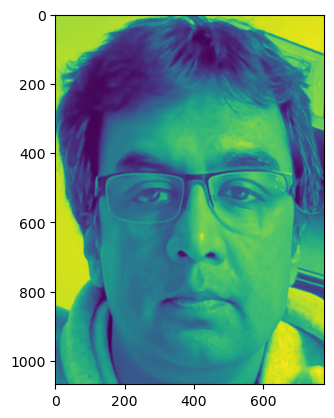

Magnitude of required change of A is: 34117.67231216104
Number of iterations: 3
3. img_warped input
img:
[[178 177 177 ... 125 125 125]
 [177 177 177 ... 125 125 125]
 [177 177 176 ... 125 125 125]
 ...
 [ 10  10  11 ...  46  47  47]
 [ 10  11  11 ...  47  47  48]
 [ 11  11  11 ...  47  48  48]]
<class 'numpy.ndarray'>
(1936, 2904)
A:
[[ 9.39946089e-01  2.26625702e-01  8.88282253e+02]
 [-2.11645108e-01  9.44005989e-01  1.65655242e+02]
 [ 7.87933945e-19 -8.07238253e-19  1.00000000e+00]]
<class 'numpy.ndarray'>
(3, 3)
output_size:
(1068, 777)
<class 'tuple'>
3. img_warped output
img_warped:
[[205. 205. 205. ... 228. 228. 227.]
 [205. 205. 205. ... 228. 228. 227.]
 [205. 205. 205. ... 228. 228. 227.]
 ...
 [155. 156. 156. ... 210. 210. 210.]
 [153. 154. 156. ... 211. 210. 210.]
 [151. 152. 154. ... 211. 210. 209.]]
<class 'numpy.ndarray'>
(1068, 777)
visualization for checking warpred function...


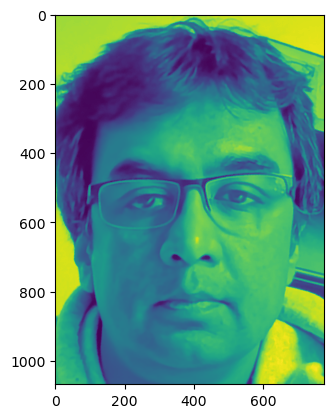

Magnitude of required change of A is: 32619.63796549557
Number of iterations: 4
3. img_warped input
img:
[[178 177 177 ... 125 125 125]
 [177 177 177 ... 125 125 125]
 [177 177 176 ... 125 125 125]
 ...
 [ 10  10  11 ...  46  47  47]
 [ 10  11  11 ...  47  47  48]
 [ 11  11  11 ...  47  48  48]]
<class 'numpy.ndarray'>
(1936, 2904)
A:
[[ 9.81940803e-01  1.96944883e-01  8.80095296e+02]
 [-2.48964760e-01  9.24392444e-01  2.05038949e+02]
 [ 8.51061910e-19 -8.05764697e-19  1.00000000e+00]]
<class 'numpy.ndarray'>
(3, 3)
output_size:
(1068, 777)
<class 'tuple'>
3. img_warped output
img_warped:
[[206. 206. 206. ... 228. 228. 228.]
 [206. 206. 206. ... 228. 228. 228.]
 [206. 206. 206. ... 228. 228. 228.]
 ...
 [146. 144. 141. ... 221. 221. 223.]
 [148. 146. 143. ... 220. 221. 222.]
 [150. 147. 145. ... 221. 221. 221.]]
<class 'numpy.ndarray'>
(1068, 777)
visualization for checking warpred function...


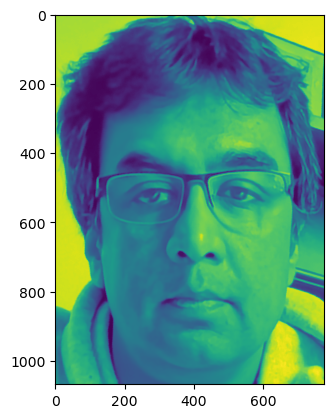

Magnitude of required change of A is: 35386.73176488611
Number of iterations: 5
3. img_warped input
img:
[[178 177 177 ... 125 125 125]
 [177 177 177 ... 125 125 125]
 [177 177 176 ... 125 125 125]
 ...
 [ 10  10  11 ...  46  47  47]
 [ 10  11  11 ...  47  47  48]
 [ 11  11  11 ...  47  48  48]]
<class 'numpy.ndarray'>
(1936, 2904)
A:
[[ 9.27747908e-01  2.24352632e-01  8.93016302e+02]
 [-2.11991574e-01  9.44162808e-01  1.67419081e+02]
 [ 7.80808375e-19 -8.08787933e-19  1.00000000e+00]]
<class 'numpy.ndarray'>
(3, 3)
output_size:
(1068, 777)
<class 'tuple'>
3. img_warped output
img_warped:
[[205. 205. 205. ... 227. 227. 228.]
 [205. 205. 205. ... 228. 228. 228.]
 [205. 205. 205. ... 228. 228. 228.]
 ...
 [153. 153. 154. ... 191. 194. 203.]
 [152. 152. 153. ... 187. 189. 200.]
 [151. 152. 153. ... 186. 189. 195.]]
<class 'numpy.ndarray'>
(1068, 777)
visualization for checking warpred function...


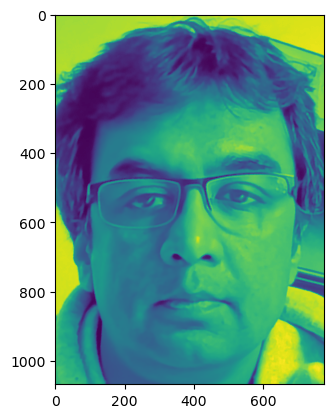

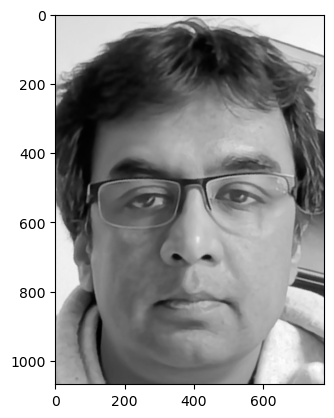

Magnitude of required change of A is: 31913.92952928235
Number of iterations: 6
3. img_warped input
img:
[[178 177 177 ... 125 125 125]
 [177 177 177 ... 125 125 125]
 [177 177 176 ... 125 125 125]
 ...
 [ 10  10  11 ...  46  47  47]
 [ 10  11  11 ...  47  47  48]
 [ 11  11  11 ...  47  48  48]]
<class 'numpy.ndarray'>
(1936, 2904)
A:
[[ 9.90234540e-01  2.00843519e-01  8.73841136e+02]
 [-2.55600546e-01  9.28856771e-01  2.06249958e+02]
 [ 8.62793095e-19 -8.07850434e-19  1.00000000e+00]]
<class 'numpy.ndarray'>
(3, 3)
output_size:
(1068, 777)
<class 'tuple'>
3. img_warped output
img_warped:
[[206. 206. 206. ... 228. 228. 228.]
 [206. 206. 206. ... 228. 228. 228.]
 [206. 206. 206. ... 228. 228. 228.]
 ...
 [162. 160. 157. ... 222. 223. 221.]
 [163. 162. 159. ... 220. 222. 220.]
 [165. 163. 161. ... 220. 219. 219.]]
<class 'numpy.ndarray'>
(1068, 777)
visualization for checking warpred function...


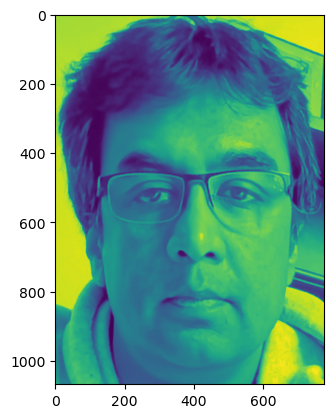

Magnitude of required change of A is: 36715.45735790309
Number of iterations: 7
3. img_warped input
img:
[[178 177 177 ... 125 125 125]
 [177 177 177 ... 125 125 125]
 [177 177 176 ... 125 125 125]
 ...
 [ 10  10  11 ...  46  47  47]
 [ 10  11  11 ...  47  47  48]
 [ 11  11  11 ...  47  48  48]]
<class 'numpy.ndarray'>
(1936, 2904)
A:
[[ 9.27526063e-01  2.16340993e-01  8.96804853e+02]
 [-2.14205285e-01  9.38255232e-01  1.71121066e+02]
 [ 7.82891027e-19 -8.07775478e-19  1.00000000e+00]]
<class 'numpy.ndarray'>
(3, 3)
output_size:
(1068, 777)
<class 'tuple'>
3. img_warped output
img_warped:
[[205. 205. 206. ... 228. 228. 228.]
 [206. 206. 206. ... 227. 228. 228.]
 [206. 206. 206. ... 227. 228. 228.]
 ...
 [151. 154. 155. ... 207. 209. 208.]
 [150. 152. 153. ... 206. 206. 205.]
 [150. 151. 153. ... 206. 204. 204.]]
<class 'numpy.ndarray'>
(1068, 777)
visualization for checking warpred function...


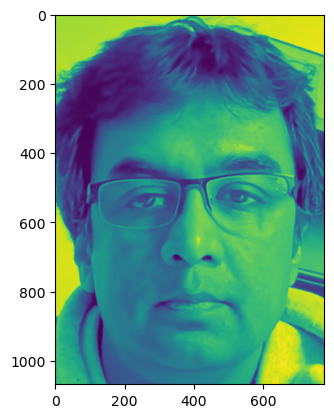

Magnitude of required change of A is: 31037.532150607592
Number of iterations: 8
3. img_warped input
img:
[[178 177 177 ... 125 125 125]
 [177 177 177 ... 125 125 125]
 [177 177 176 ... 125 125 125]
 ...
 [ 10  10  11 ...  46  47  47]
 [ 10  11  11 ...  47  47  48]
 [ 11  11  11 ...  47  48  48]]
<class 'numpy.ndarray'>
(1936, 2904)
A:
[[ 9.98682104e-01  2.16490273e-01  8.62457751e+02]
 [-2.61523496e-01  9.29918256e-01  2.08964779e+02]
 [ 8.73904120e-19 -7.99328800e-19  1.00000000e+00]]
<class 'numpy.ndarray'>
(3, 3)
output_size:
(1068, 777)
<class 'tuple'>
3. img_warped output
img_warped:
[[205. 206. 206. ... 226. 226. 227.]
 [206. 206. 206. ... 226. 227. 228.]
 [206. 206. 206. ... 227. 227. 227.]
 ...
 [157. 153. 150. ... 215. 217. 196.]
 [162. 157. 153. ... 218. 221. 216.]
 [163. 158. 150. ... 223. 221. 220.]]
<class 'numpy.ndarray'>
(1068, 777)
visualization for checking warpred function...


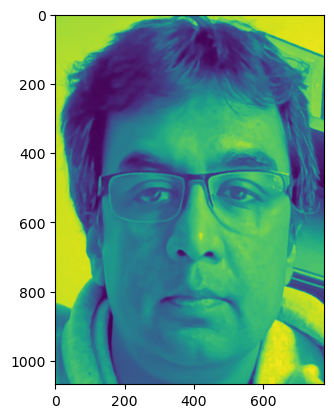

Magnitude of required change of A is: 38025.929824265964
Number of iterations: 9
3. img_warped input
img:
[[178 177 177 ... 125 125 125]
 [177 177 177 ... 125 125 125]
 [177 177 176 ... 125 125 125]
 ...
 [ 10  10  11 ...  46  47  47]
 [ 10  11  11 ...  47  47  48]
 [ 11  11  11 ...  47  48  48]]
<class 'numpy.ndarray'>
(1936, 2904)
A:
[[ 9.13851557e-01  1.98996421e-01  9.10411814e+02]
 [-2.18703298e-01  9.30747659e-01  1.76215168e+02]
 [ 7.79021674e-19 -8.10877021e-19  1.00000000e+00]]
<class 'numpy.ndarray'>
(3, 3)
output_size:
(1068, 777)
<class 'tuple'>
3. img_warped output
img_warped:
[[206. 206. 206. ... 227. 227. 227.]
 [206. 206. 206. ... 227. 227. 227.]
 [206. 206. 206. ... 227. 227. 227.]
 ...
 [127. 141. 145. ... 213. 214. 217.]
 [127. 137. 143. ... 211. 212. 215.]
 [132. 140. 146. ... 208. 209. 211.]]
<class 'numpy.ndarray'>
(1068, 777)
visualization for checking warpred function...


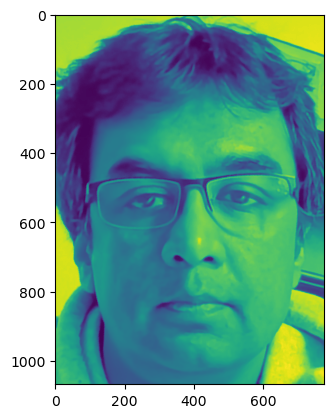

Magnitude of required change of A is: 31329.65467412624
Number of iterations: 10
3. img_warped input
img:
[[178 177 177 ... 125 125 125]
 [177 177 177 ... 125 125 125]
 [177 177 176 ... 125 125 125]
 ...
 [ 10  10  11 ...  46  47  47]
 [ 10  11  11 ...  47  47  48]
 [ 11  11  11 ...  47  48  48]]
<class 'numpy.ndarray'>
(1936, 2904)
A:
[[ 1.01204352e+00  2.29118362e-01  8.47481801e+02]
 [-2.54575195e-01  9.40048848e-01  1.98511791e+02]
 [ 8.75126016e-19 -8.01745407e-19  1.00000000e+00]]
<class 'numpy.ndarray'>
(3, 3)
output_size:
(1068, 777)
<class 'tuple'>
3. img_warped output
img_warped:
[[205. 205. 205. ... 228. 229. 228.]
 [205. 205. 205. ... 228. 228. 228.]
 [205. 205. 205. ... 228. 228. 228.]
 ...
 [164. 164. 153. ... 217. 219. 220.]
 [165. 162. 157. ... 217. 219. 220.]
 [167. 163. 158. ... 217. 220. 221.]]
<class 'numpy.ndarray'>
(1068, 777)
visualization for checking warpred function...


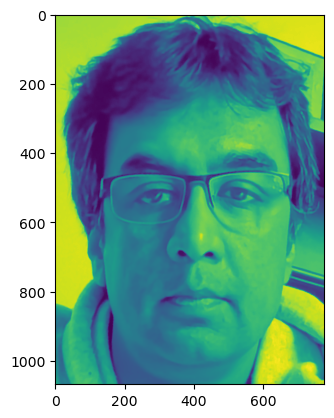

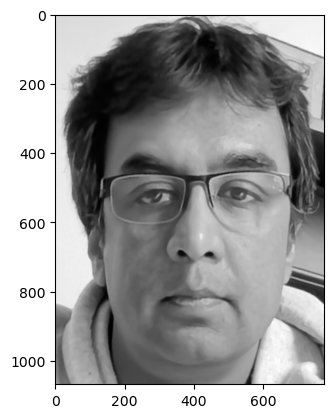

Magnitude of required change of A is: 39856.01534273089
Number of iterations: 11
4. Inverse Compositional Image Alignment output
refined A:
[[ 1.01204352e+00  2.29118362e-01  8.47481801e+02]
 [-2.54575195e-01  9.40048848e-01  1.98511791e+02]
 [ 8.75126016e-19 -8.01745407e-19  1.00000000e+00]]
<class 'numpy.ndarray'>
(3, 3)
3. img_warped input
img:
[[178 177 177 ... 125 125 125]
 [177 177 177 ... 125 125 125]
 [177 177 176 ... 125 125 125]
 ...
 [ 10  10  11 ...  46  47  47]
 [ 10  11  11 ...  47  47  48]
 [ 11  11  11 ...  47  48  48]]
<class 'numpy.ndarray'>
(1936, 2904)
A:
[[ 9.37761086e-01  2.10698689e-01  8.88832688e+02]
 [-2.38143347e-01  9.40170628e-01  1.89267407e+02]
 [ 8.13151629e-19 -8.13151629e-19  1.00000000e+00]]
<class 'numpy.ndarray'>
(3, 3)
output_size:
(1068, 777)
<class 'tuple'>
3. img_warped output
img_warped:
[[207. 207. 207. ... 228. 228. 228.]
 [207. 207. 207. ... 227. 228. 228.]
 [206. 207. 207. ... 227. 228. 228.]
 ...
 [101. 102. 103. ... 200. 201. 203.]
 [101.

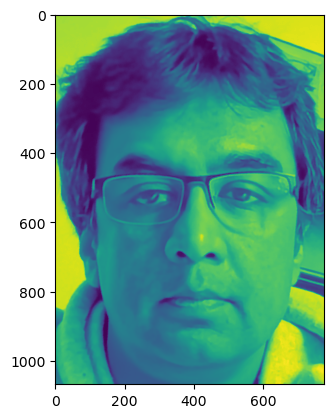

3. img_warped input
img:
[[178 177 177 ... 125 125 125]
 [177 177 177 ... 125 125 125]
 [177 177 176 ... 125 125 125]
 ...
 [ 10  10  11 ...  46  47  47]
 [ 10  11  11 ...  47  47  48]
 [ 11  11  11 ...  47  48  48]]
<class 'numpy.ndarray'>
(1936, 2904)
A:
[[ 1.01204352e+00  2.29118362e-01  8.47481801e+02]
 [-2.54575195e-01  9.40048848e-01  1.98511791e+02]
 [ 8.75126016e-19 -8.01745407e-19  1.00000000e+00]]
<class 'numpy.ndarray'>
(3, 3)
output_size:
(1068, 777)
<class 'tuple'>
3. img_warped output
img_warped:
[[205. 205. 205. ... 228. 229. 228.]
 [205. 205. 205. ... 228. 228. 228.]
 [205. 205. 205. ... 228. 228. 228.]
 ...
 [164. 164. 153. ... 217. 219. 220.]
 [165. 162. 157. ... 217. 219. 220.]
 [167. 163. 158. ... 217. 220. 221.]]
<class 'numpy.ndarray'>
(1068, 777)
visualization for checking warpred function...


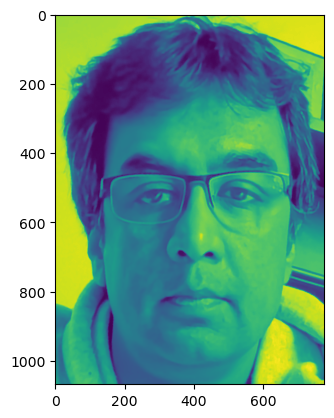

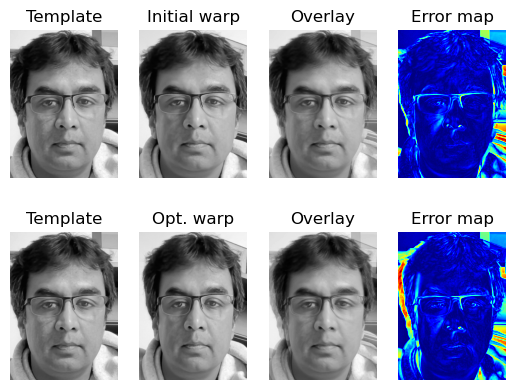

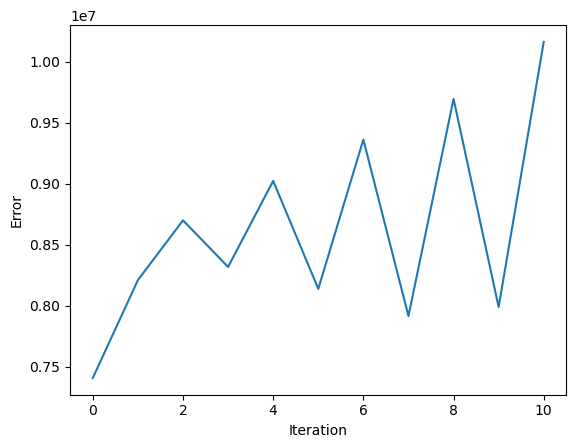

5. track_multi_frames input
template:
[[213 213 213 ... 179 180 181]
 [213 213 213 ... 179 180 182]
 [213 213 213 ... 179 180 181]
 ...
 [107 106 104 ... 191 190 192]
 [108 106 104 ... 191 191 192]
 [109 107 105 ... 191 191 193]]
<class 'numpy.ndarray'>
(1068, 777)
img_list:
[array([[178, 177, 177, ..., 125, 125, 125],
       [177, 177, 177, ..., 125, 125, 125],
       [177, 177, 176, ..., 125, 125, 125],
       ...,
       [ 10,  10,  11, ...,  46,  47,  47],
       [ 10,  11,  11, ...,  47,  47,  48],
       [ 11,  11,  11, ...,  47,  48,  48]], dtype=uint8), array([[176, 176, 176, ..., 125, 125, 125],
       [176, 176, 176, ..., 125, 125, 125],
       [176, 176, 176, ..., 126, 126, 126],
       ...,
       [ 22,  21,  21, ...,  47,  47,  47],
       [ 22,  22,  22, ...,  47,  48,  48],
       [ 23,  23,  22, ...,  48,  48,  48]], dtype=uint8), array([[174, 174, 174, ..., 123, 123, 123],
       [174, 174, 174, ..., 123, 123, 124],
       [174, 174, 174, ..., 124, 124, 124],
       ..

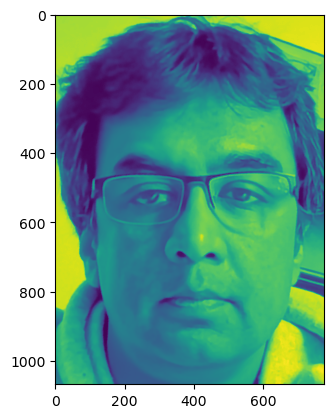

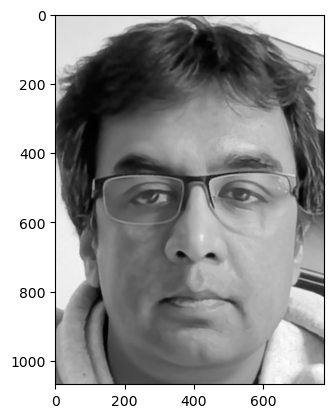

Magnitude of required change of A is: 29049.735265575142
Number of iterations: 1
3. img_warped input
img:
[[178 177 177 ... 125 125 125]
 [177 177 177 ... 125 125 125]
 [177 177 176 ... 125 125 125]
 ...
 [ 10  10  11 ...  46  47  47]
 [ 10  11  11 ...  47  47  48]
 [ 11  11  11 ...  47  48  48]]
<class 'numpy.ndarray'>
(1936, 2904)
A:
[[ 9.46204457e-01  2.24049455e-01  8.86808616e+02]
 [-2.17129425e-01  9.47105427e-01  1.66699022e+02]
 [ 7.97264241e-19 -8.11922726e-19  1.00000000e+00]]
<class 'numpy.ndarray'>
(3, 3)
output_size:
(1068, 777)
<class 'tuple'>
3. img_warped output
img_warped:
[[204. 205. 205. ... 227. 227. 227.]
 [205. 205. 205. ... 227. 227. 227.]
 [205. 205. 204. ... 227. 227. 227.]
 ...
 [115. 125. 132. ... 210. 210. 210.]
 [116. 125. 134. ... 210. 210. 209.]
 [112. 119. 129. ... 211. 210. 209.]]
<class 'numpy.ndarray'>
(1068, 777)
visualization for checking warpred function...


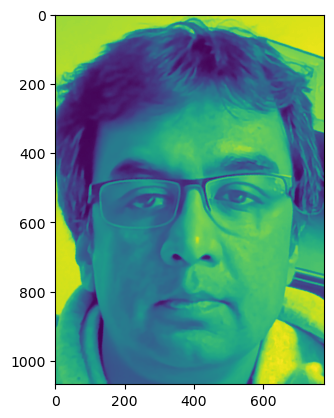

Magnitude of required change of A is: 32196.371457044657
Number of iterations: 2
3. img_warped input
img:
[[178 177 177 ... 125 125 125]
 [177 177 177 ... 125 125 125]
 [177 177 176 ... 125 125 125]
 ...
 [ 10  10  11 ...  46  47  47]
 [ 10  11  11 ...  47  47  48]
 [ 11  11  11 ...  47  48  48]]
<class 'numpy.ndarray'>
(1936, 2904)
A:
[[ 9.67863523e-01  1.96291056e-01  8.85240640e+02]
 [-2.49271219e-01  9.26280248e-01  2.04994352e+02]
 [ 8.42745080e-19 -8.08057178e-19  1.00000000e+00]]
<class 'numpy.ndarray'>
(3, 3)
output_size:
(1068, 777)
<class 'tuple'>
3. img_warped output
img_warped:
[[207. 207. 206. ... 228. 228. 228.]
 [207. 207. 207. ... 228. 228. 228.]
 [207. 207. 207. ... 228. 228. 228.]
 ...
 [141. 138. 135. ... 220. 221. 221.]
 [140. 139. 136. ... 220. 220. 220.]
 [140. 137. 135. ... 218. 218. 218.]]
<class 'numpy.ndarray'>
(1068, 777)
visualization for checking warpred function...


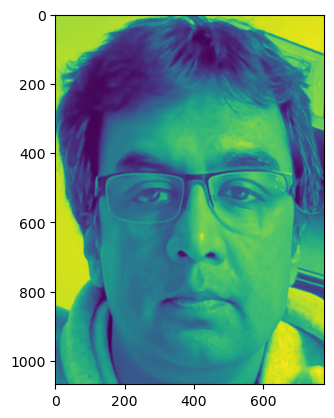

Magnitude of required change of A is: 34117.67231216104
Number of iterations: 3
3. img_warped input
img:
[[178 177 177 ... 125 125 125]
 [177 177 177 ... 125 125 125]
 [177 177 176 ... 125 125 125]
 ...
 [ 10  10  11 ...  46  47  47]
 [ 10  11  11 ...  47  47  48]
 [ 11  11  11 ...  47  48  48]]
<class 'numpy.ndarray'>
(1936, 2904)
A:
[[ 9.39946089e-01  2.26625702e-01  8.88282253e+02]
 [-2.11645108e-01  9.44005989e-01  1.65655242e+02]
 [ 7.87933945e-19 -8.07238253e-19  1.00000000e+00]]
<class 'numpy.ndarray'>
(3, 3)
output_size:
(1068, 777)
<class 'tuple'>
3. img_warped output
img_warped:
[[205. 205. 205. ... 228. 228. 227.]
 [205. 205. 205. ... 228. 228. 227.]
 [205. 205. 205. ... 228. 228. 227.]
 ...
 [155. 156. 156. ... 210. 210. 210.]
 [153. 154. 156. ... 211. 210. 210.]
 [151. 152. 154. ... 211. 210. 209.]]
<class 'numpy.ndarray'>
(1068, 777)
visualization for checking warpred function...


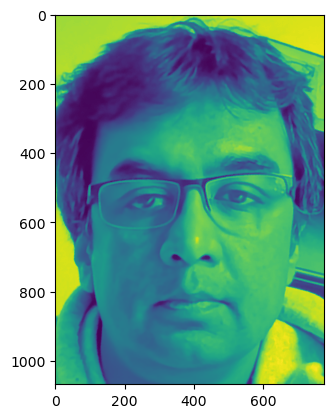

Magnitude of required change of A is: 32619.63796549557
Number of iterations: 4
3. img_warped input
img:
[[178 177 177 ... 125 125 125]
 [177 177 177 ... 125 125 125]
 [177 177 176 ... 125 125 125]
 ...
 [ 10  10  11 ...  46  47  47]
 [ 10  11  11 ...  47  47  48]
 [ 11  11  11 ...  47  48  48]]
<class 'numpy.ndarray'>
(1936, 2904)
A:
[[ 9.81940803e-01  1.96944883e-01  8.80095296e+02]
 [-2.48964760e-01  9.24392444e-01  2.05038949e+02]
 [ 8.51061910e-19 -8.05764697e-19  1.00000000e+00]]
<class 'numpy.ndarray'>
(3, 3)
output_size:
(1068, 777)
<class 'tuple'>
3. img_warped output
img_warped:
[[206. 206. 206. ... 228. 228. 228.]
 [206. 206. 206. ... 228. 228. 228.]
 [206. 206. 206. ... 228. 228. 228.]
 ...
 [146. 144. 141. ... 221. 221. 223.]
 [148. 146. 143. ... 220. 221. 222.]
 [150. 147. 145. ... 221. 221. 221.]]
<class 'numpy.ndarray'>
(1068, 777)
visualization for checking warpred function...


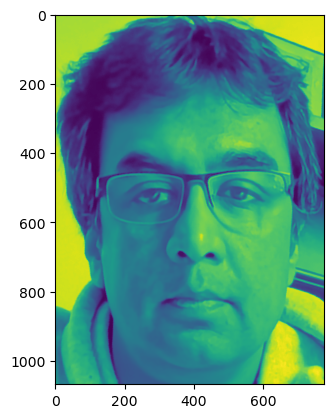

Magnitude of required change of A is: 35386.73176488611
Number of iterations: 5
3. img_warped input
img:
[[178 177 177 ... 125 125 125]
 [177 177 177 ... 125 125 125]
 [177 177 176 ... 125 125 125]
 ...
 [ 10  10  11 ...  46  47  47]
 [ 10  11  11 ...  47  47  48]
 [ 11  11  11 ...  47  48  48]]
<class 'numpy.ndarray'>
(1936, 2904)
A:
[[ 9.27747908e-01  2.24352632e-01  8.93016302e+02]
 [-2.11991574e-01  9.44162808e-01  1.67419081e+02]
 [ 7.80808375e-19 -8.08787933e-19  1.00000000e+00]]
<class 'numpy.ndarray'>
(3, 3)
output_size:
(1068, 777)
<class 'tuple'>
3. img_warped output
img_warped:
[[205. 205. 205. ... 227. 227. 228.]
 [205. 205. 205. ... 228. 228. 228.]
 [205. 205. 205. ... 228. 228. 228.]
 ...
 [153. 153. 154. ... 191. 194. 203.]
 [152. 152. 153. ... 187. 189. 200.]
 [151. 152. 153. ... 186. 189. 195.]]
<class 'numpy.ndarray'>
(1068, 777)
visualization for checking warpred function...


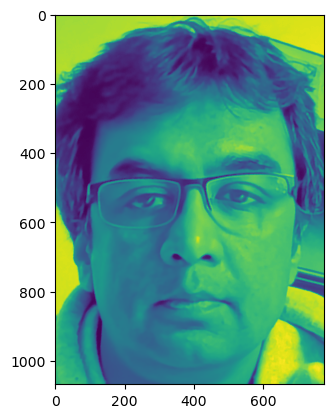

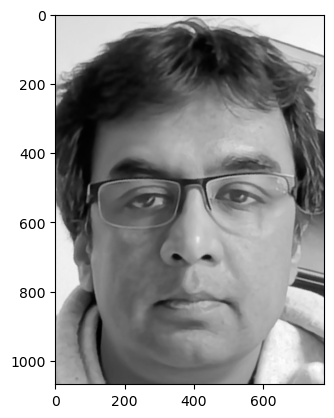

Magnitude of required change of A is: 31913.92952928235
Number of iterations: 6
3. img_warped input
img:
[[178 177 177 ... 125 125 125]
 [177 177 177 ... 125 125 125]
 [177 177 176 ... 125 125 125]
 ...
 [ 10  10  11 ...  46  47  47]
 [ 10  11  11 ...  47  47  48]
 [ 11  11  11 ...  47  48  48]]
<class 'numpy.ndarray'>
(1936, 2904)
A:
[[ 9.90234540e-01  2.00843519e-01  8.73841136e+02]
 [-2.55600546e-01  9.28856771e-01  2.06249958e+02]
 [ 8.62793095e-19 -8.07850434e-19  1.00000000e+00]]
<class 'numpy.ndarray'>
(3, 3)
output_size:
(1068, 777)
<class 'tuple'>
3. img_warped output
img_warped:
[[206. 206. 206. ... 228. 228. 228.]
 [206. 206. 206. ... 228. 228. 228.]
 [206. 206. 206. ... 228. 228. 228.]
 ...
 [162. 160. 157. ... 222. 223. 221.]
 [163. 162. 159. ... 220. 222. 220.]
 [165. 163. 161. ... 220. 219. 219.]]
<class 'numpy.ndarray'>
(1068, 777)
visualization for checking warpred function...


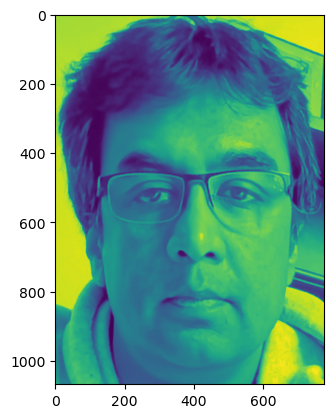

Magnitude of required change of A is: 36715.45735790309
Number of iterations: 7
3. img_warped input
img:
[[178 177 177 ... 125 125 125]
 [177 177 177 ... 125 125 125]
 [177 177 176 ... 125 125 125]
 ...
 [ 10  10  11 ...  46  47  47]
 [ 10  11  11 ...  47  47  48]
 [ 11  11  11 ...  47  48  48]]
<class 'numpy.ndarray'>
(1936, 2904)
A:
[[ 9.27526063e-01  2.16340993e-01  8.96804853e+02]
 [-2.14205285e-01  9.38255232e-01  1.71121066e+02]
 [ 7.82891027e-19 -8.07775478e-19  1.00000000e+00]]
<class 'numpy.ndarray'>
(3, 3)
output_size:
(1068, 777)
<class 'tuple'>
3. img_warped output
img_warped:
[[205. 205. 206. ... 228. 228. 228.]
 [206. 206. 206. ... 227. 228. 228.]
 [206. 206. 206. ... 227. 228. 228.]
 ...
 [151. 154. 155. ... 207. 209. 208.]
 [150. 152. 153. ... 206. 206. 205.]
 [150. 151. 153. ... 206. 204. 204.]]
<class 'numpy.ndarray'>
(1068, 777)
visualization for checking warpred function...


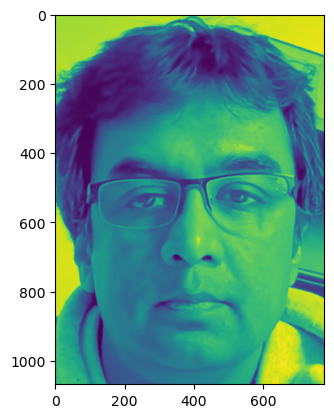

Magnitude of required change of A is: 31037.532150607592
Number of iterations: 8
3. img_warped input
img:
[[178 177 177 ... 125 125 125]
 [177 177 177 ... 125 125 125]
 [177 177 176 ... 125 125 125]
 ...
 [ 10  10  11 ...  46  47  47]
 [ 10  11  11 ...  47  47  48]
 [ 11  11  11 ...  47  48  48]]
<class 'numpy.ndarray'>
(1936, 2904)
A:
[[ 9.98682104e-01  2.16490273e-01  8.62457751e+02]
 [-2.61523496e-01  9.29918256e-01  2.08964779e+02]
 [ 8.73904120e-19 -7.99328800e-19  1.00000000e+00]]
<class 'numpy.ndarray'>
(3, 3)
output_size:
(1068, 777)
<class 'tuple'>
3. img_warped output
img_warped:
[[205. 206. 206. ... 226. 226. 227.]
 [206. 206. 206. ... 226. 227. 228.]
 [206. 206. 206. ... 227. 227. 227.]
 ...
 [157. 153. 150. ... 215. 217. 196.]
 [162. 157. 153. ... 218. 221. 216.]
 [163. 158. 150. ... 223. 221. 220.]]
<class 'numpy.ndarray'>
(1068, 777)
visualization for checking warpred function...


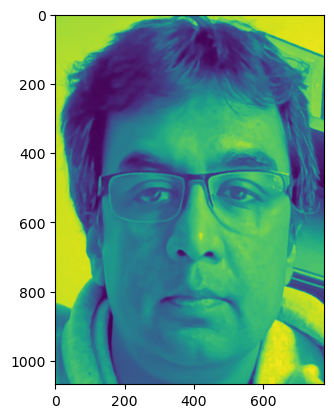

Magnitude of required change of A is: 38025.929824265964
Number of iterations: 9
3. img_warped input
img:
[[178 177 177 ... 125 125 125]
 [177 177 177 ... 125 125 125]
 [177 177 176 ... 125 125 125]
 ...
 [ 10  10  11 ...  46  47  47]
 [ 10  11  11 ...  47  47  48]
 [ 11  11  11 ...  47  48  48]]
<class 'numpy.ndarray'>
(1936, 2904)
A:
[[ 9.13851557e-01  1.98996421e-01  9.10411814e+02]
 [-2.18703298e-01  9.30747659e-01  1.76215168e+02]
 [ 7.79021674e-19 -8.10877021e-19  1.00000000e+00]]
<class 'numpy.ndarray'>
(3, 3)
output_size:
(1068, 777)
<class 'tuple'>
3. img_warped output
img_warped:
[[206. 206. 206. ... 227. 227. 227.]
 [206. 206. 206. ... 227. 227. 227.]
 [206. 206. 206. ... 227. 227. 227.]
 ...
 [127. 141. 145. ... 213. 214. 217.]
 [127. 137. 143. ... 211. 212. 215.]
 [132. 140. 146. ... 208. 209. 211.]]
<class 'numpy.ndarray'>
(1068, 777)
visualization for checking warpred function...


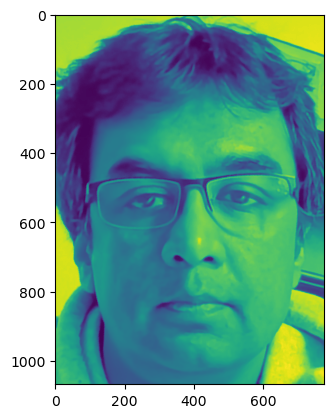

Magnitude of required change of A is: 31329.65467412624
Number of iterations: 10
3. img_warped input
img:
[[178 177 177 ... 125 125 125]
 [177 177 177 ... 125 125 125]
 [177 177 176 ... 125 125 125]
 ...
 [ 10  10  11 ...  46  47  47]
 [ 10  11  11 ...  47  47  48]
 [ 11  11  11 ...  47  48  48]]
<class 'numpy.ndarray'>
(1936, 2904)
A:
[[ 1.01204352e+00  2.29118362e-01  8.47481801e+02]
 [-2.54575195e-01  9.40048848e-01  1.98511791e+02]
 [ 8.75126016e-19 -8.01745407e-19  1.00000000e+00]]
<class 'numpy.ndarray'>
(3, 3)
output_size:
(1068, 777)
<class 'tuple'>
3. img_warped output
img_warped:
[[205. 205. 205. ... 228. 229. 228.]
 [205. 205. 205. ... 228. 228. 228.]
 [205. 205. 205. ... 228. 228. 228.]
 ...
 [164. 164. 153. ... 217. 219. 220.]
 [165. 162. 157. ... 217. 219. 220.]
 [167. 163. 158. ... 217. 220. 221.]]
<class 'numpy.ndarray'>
(1068, 777)
visualization for checking warpred function...


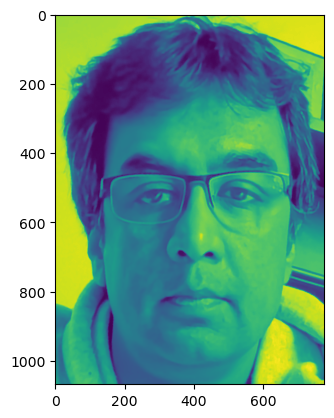

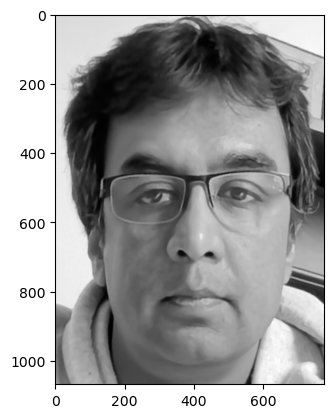

Magnitude of required change of A is: 39856.01534273089
Number of iterations: 11
4. Inverse Compositional Image Alignment output
refined A:
[[ 1.01204352e+00  2.29118362e-01  8.47481801e+02]
 [-2.54575195e-01  9.40048848e-01  1.98511791e+02]
 [ 8.75126016e-19 -8.01745407e-19  1.00000000e+00]]
<class 'numpy.ndarray'>
(3, 3)
3. img_warped input
img:
[[178 177 177 ... 125 125 125]
 [177 177 177 ... 125 125 125]
 [177 177 176 ... 125 125 125]
 ...
 [ 10  10  11 ...  46  47  47]
 [ 10  11  11 ...  47  47  48]
 [ 11  11  11 ...  47  48  48]]
<class 'numpy.ndarray'>
(1936, 2904)
A:
[[ 9.37761086e-01  2.10698689e-01  8.88832688e+02]
 [-2.38143347e-01  9.40170628e-01  1.89267407e+02]
 [ 8.13151629e-19 -8.13151629e-19  1.00000000e+00]]
<class 'numpy.ndarray'>
(3, 3)
output_size:
(1068, 777)
<class 'tuple'>
3. img_warped output
img_warped:
[[207. 207. 207. ... 228. 228. 228.]
 [207. 207. 207. ... 227. 228. 228.]
 [206. 207. 207. ... 227. 228. 228.]
 ...
 [101. 102. 103. ... 200. 201. 203.]
 [101.

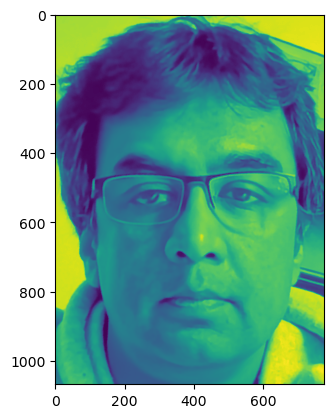

3. img_warped input
img:
[[178 177 177 ... 125 125 125]
 [177 177 177 ... 125 125 125]
 [177 177 176 ... 125 125 125]
 ...
 [ 10  10  11 ...  46  47  47]
 [ 10  11  11 ...  47  47  48]
 [ 11  11  11 ...  47  48  48]]
<class 'numpy.ndarray'>
(1936, 2904)
A:
[[ 1.01204352e+00  2.29118362e-01  8.47481801e+02]
 [-2.54575195e-01  9.40048848e-01  1.98511791e+02]
 [ 8.75126016e-19 -8.01745407e-19  1.00000000e+00]]
<class 'numpy.ndarray'>
(3, 3)
output_size:
(1068, 777)
<class 'tuple'>
3. img_warped output
img_warped:
[[205. 205. 205. ... 228. 229. 228.]
 [205. 205. 205. ... 228. 228. 228.]
 [205. 205. 205. ... 228. 228. 228.]
 ...
 [164. 164. 153. ... 217. 219. 220.]
 [165. 162. 157. ... 217. 219. 220.]
 [167. 163. 158. ... 217. 220. 221.]]
<class 'numpy.ndarray'>
(1068, 777)
visualization for checking warpred function...


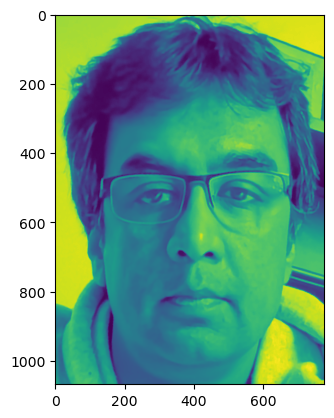

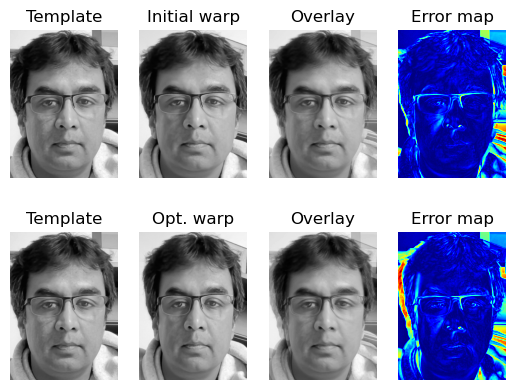

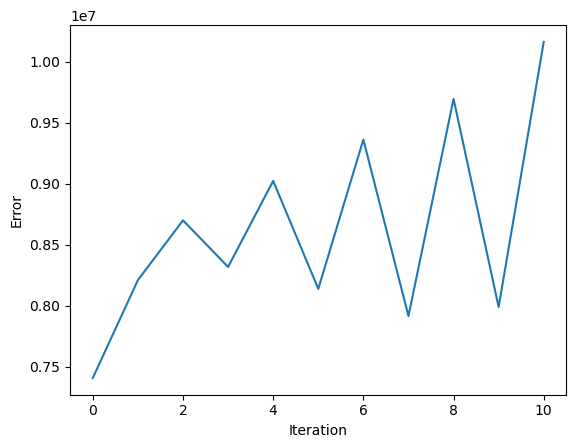

4. Inverse Compositional Image Alignment input
template:
[[213 213 213 ... 179 180 181]
 [213 213 213 ... 179 180 182]
 [213 213 213 ... 179 180 181]
 ...
 [107 106 104 ... 191 190 192]
 [108 106 104 ... 191 191 192]
 [109 107 105 ... 191 191 193]]
<class 'numpy.ndarray'>
(1068, 777)
target:
[[176 176 176 ... 125 125 125]
 [176 176 176 ... 125 125 125]
 [176 176 176 ... 126 126 126]
 ...
 [ 22  21  21 ...  47  47  47]
 [ 22  22  22 ...  47  48  48]
 [ 23  23  22 ...  48  48  48]]
<class 'numpy.ndarray'>
(1936, 2904)
A:
[[ 9.37761086e-01  2.10698689e-01  8.88832688e+02]
 [-2.38143347e-01  9.40170628e-01  1.89267407e+02]
 [ 8.13151629e-19 -8.13151629e-19  1.00000000e+00]]
<class 'numpy.ndarray'>
(3, 3)
3. img_warped input
img:
[[176 176 176 ... 125 125 125]
 [176 176 176 ... 125 125 125]
 [176 176 176 ... 126 126 126]
 ...
 [ 22  21  21 ...  47  47  47]
 [ 22  22  22 ...  47  48  48]
 [ 23  23  22 ...  48  48  48]]
<class 'numpy.ndarray'>
(1936, 2904)
A:
[[ 9.37761086e-01  2.10698689e-01

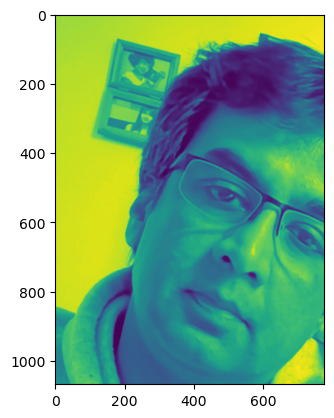

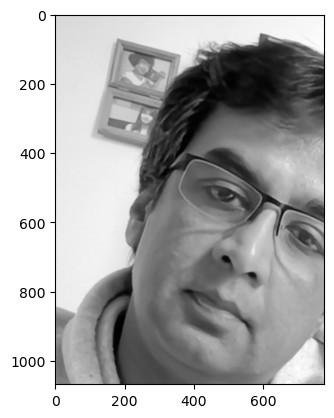

Magnitude of required change of A is: 79863.04165256918
Number of iterations: 1
3. img_warped input
img:
[[176 176 176 ... 125 125 125]
 [176 176 176 ... 125 125 125]
 [176 176 176 ... 126 126 126]
 ...
 [ 22  21  21 ...  47  47  47]
 [ 22  22  22 ...  47  48  48]
 [ 23  23  22 ...  48  48  48]]
<class 'numpy.ndarray'>
(1936, 2904)
A:
[[ 9.07282684e-01  1.63808393e-01  9.43276704e+02]
 [-2.17025986e-01  8.82405505e-01  2.09096138e+02]
 [ 7.73316497e-19 -7.83985764e-19  1.00000000e+00]]
<class 'numpy.ndarray'>
(3, 3)
output_size:
(1068, 777)
<class 'tuple'>
3. img_warped output
img_warped:
[[207. 207. 207. ... 236. 236. 236.]
 [207. 207. 207. ... 236. 236. 236.]
 [207. 207. 207. ... 236. 236. 236.]
 ...
 [107. 107. 107. ... 201. 200. 200.]
 [107. 107. 107. ... 199. 199. 199.]
 [107. 107. 107. ... 198. 199. 198.]]
<class 'numpy.ndarray'>
(1068, 777)
visualization for checking warpred function...


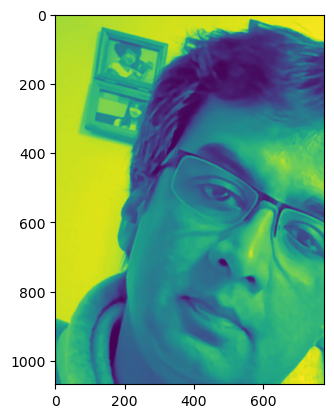

Magnitude of required change of A is: 74383.18766361118
Number of iterations: 2
3. img_warped input
img:
[[176 176 176 ... 125 125 125]
 [176 176 176 ... 125 125 125]
 [176 176 176 ... 126 126 126]
 ...
 [ 22  21  21 ...  47  47  47]
 [ 22  22  22 ...  47  48  48]
 [ 23  23  22 ...  48  48  48]]
<class 'numpy.ndarray'>
(1936, 2904)
A:
[[ 8.77580068e-01  1.25822500e-01  9.93026579e+02]
 [-2.01818705e-01  8.45423431e-01  2.19929544e+02]
 [ 7.39879642e-19 -7.70193472e-19  1.00000000e+00]]
<class 'numpy.ndarray'>
(3, 3)
output_size:
(1068, 777)
<class 'tuple'>
3. img_warped output
img_warped:
[[209. 210. 210. ... 237. 237. 236.]
 [209. 210. 210. ... 237. 237. 237.]
 [209. 210. 210. ... 237. 237. 237.]
 ...
 [163. 162. 162. ... 211. 211. 211.]
 [163. 162. 162. ... 209. 210. 211.]
 [162. 162. 162. ... 210. 210. 211.]]
<class 'numpy.ndarray'>
(1068, 777)
visualization for checking warpred function...


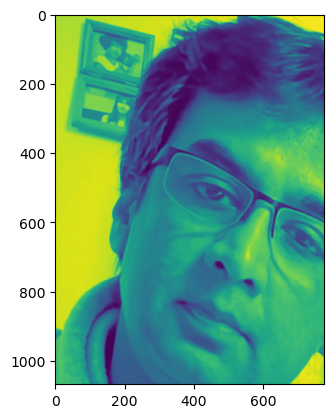

Magnitude of required change of A is: 70275.81383377926
Number of iterations: 3
3. img_warped input
img:
[[176 176 176 ... 125 125 125]
 [176 176 176 ... 125 125 125]
 [176 176 176 ... 126 126 126]
 ...
 [ 22  21  21 ...  47  47  47]
 [ 22  22  22 ...  47  48  48]
 [ 23  23  22 ...  48  48  48]]
<class 'numpy.ndarray'>
(1936, 2904)
A:
[[ 8.47919368e-01  9.70222971e-02  1.03614292e+03]
 [-1.97342455e-01  8.39974563e-01  2.17115571e+02]
 [ 7.17222990e-19 -7.82376124e-19  1.00000000e+00]]
<class 'numpy.ndarray'>
(3, 3)
output_size:
(1068, 777)
<class 'tuple'>
3. img_warped output
img_warped:
[[211. 211. 211. ... 237. 237. 237.]
 [211. 212. 211. ... 236. 237. 237.]
 [211. 212. 212. ... 236. 237. 236.]
 ...
 [170. 171. 171. ... 226. 224. 224.]
 [169. 169. 170. ... 226. 226. 218.]
 [169. 169. 170. ... 226. 222. 218.]]
<class 'numpy.ndarray'>
(1068, 777)
visualization for checking warpred function...


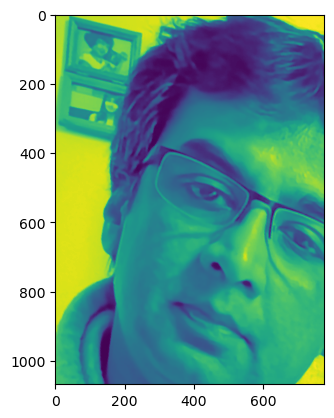

Magnitude of required change of A is: 67000.54223661179
Number of iterations: 4
3. img_warped input
img:
[[176 176 176 ... 125 125 125]
 [176 176 176 ... 125 125 125]
 [176 176 176 ... 126 126 126]
 ...
 [ 22  21  21 ...  47  47  47]
 [ 22  22  22 ...  47  48  48]
 [ 23  23  22 ...  48  48  48]]
<class 'numpy.ndarray'>
(1936, 2904)
A:
[[ 8.27320787e-01  6.70801464e-02  1.07328407e+03]
 [-1.92787911e-01  8.42195533e-01  2.09797276e+02]
 [ 7.00039465e-19 -8.02944979e-19  1.00000000e+00]]
<class 'numpy.ndarray'>
(3, 3)
output_size:
(1068, 777)
<class 'tuple'>
3. img_warped output
img_warped:
[[207. 208. 212. ... 221. 198. 198.]
 [197. 208. 210. ... 213. 199. 199.]
 [197. 195. 197. ... 214. 200. 199.]
 ...
 [169. 169. 166. ... 232. 231. 231.]
 [169. 167. 167. ... 232. 231. 231.]
 [169. 167. 166. ... 231. 231. 230.]]
<class 'numpy.ndarray'>
(1068, 777)
visualization for checking warpred function...


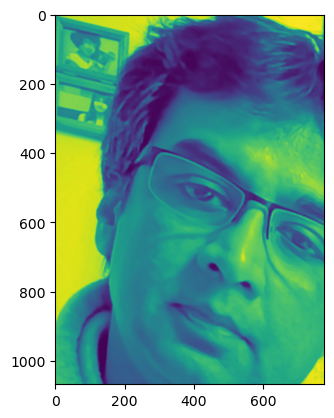

Magnitude of required change of A is: 64494.81652815209
Number of iterations: 5
3. img_warped input
img:
[[176 176 176 ... 125 125 125]
 [176 176 176 ... 125 125 125]
 [176 176 176 ... 126 126 126]
 ...
 [ 22  21  21 ...  47  47  47]
 [ 22  22  22 ...  47  48  48]
 [ 23  23  22 ...  48  48  48]]
<class 'numpy.ndarray'>
(1936, 2904)
A:
[[ 8.02590618e-01  2.87798408e-02  1.11721534e+03]
 [-1.83966059e-01  8.49772689e-01  1.97076424e+02]
 [ 6.76048217e-19 -8.34002082e-19  1.00000000e+00]]
<class 'numpy.ndarray'>
(3, 3)
output_size:
(1068, 777)
<class 'tuple'>
3. img_warped output
img_warped:
[[216. 216. 216. ... 122. 121. 121.]
 [216. 216. 216. ... 122. 121. 120.]
 [216. 216. 216. ... 121. 121. 121.]
 ...
 [167. 167. 167. ... 233. 234. 234.]
 [167. 167. 167. ... 233. 233. 233.]
 [166. 167. 167. ... 233. 233. 233.]]
<class 'numpy.ndarray'>
(1068, 777)
visualization for checking warpred function...


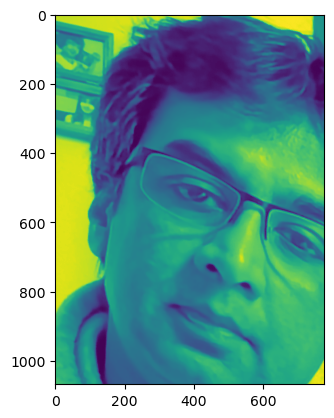

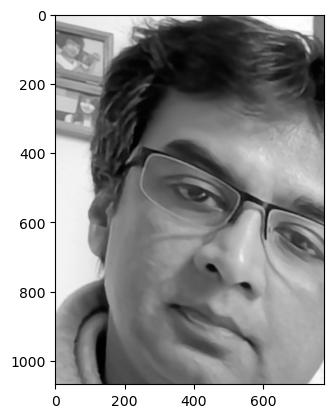

Magnitude of required change of A is: 60425.1953161924
Number of iterations: 6
3. img_warped input
img:
[[176 176 176 ... 125 125 125]
 [176 176 176 ... 125 125 125]
 [176 176 176 ... 126 126 126]
 ...
 [ 22  21  21 ...  47  47  47]
 [ 22  22  22 ...  47  48  48]
 [ 23  23  22 ...  48  48  48]]
<class 'numpy.ndarray'>
(1936, 2904)
A:
[[ 7.70436404e-01 -1.63637123e-02  1.17075501e+03]
 [-1.76945581e-01  8.61978427e-01  1.82101627e+02]
 [ 6.49314201e-19 -8.73890180e-19  1.00000000e+00]]
<class 'numpy.ndarray'>
(3, 3)
output_size:
(1068, 777)
<class 'tuple'>
3. img_warped output
img_warped:
[[220. 220. 220. ... 122. 121. 121.]
 [219. 220. 220. ... 122. 122. 122.]
 [220. 220. 220. ... 122. 122. 122.]
 ...
 [168. 168. 168. ... 233. 233. 234.]
 [168. 168. 167. ... 232. 232. 233.]
 [167. 167. 167. ... 231. 231. 231.]]
<class 'numpy.ndarray'>
(1068, 777)
visualization for checking warpred function...


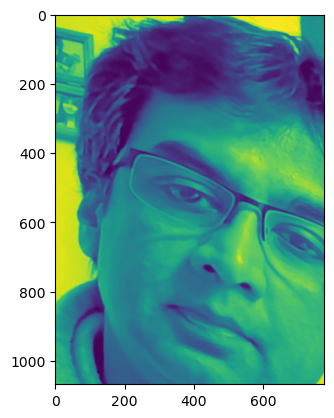

Magnitude of required change of A is: 53212.002640381805
Number of iterations: 7
3. img_warped input
img:
[[176 176 176 ... 125 125 125]
 [176 176 176 ... 125 125 125]
 [176 176 176 ... 126 126 126]
 ...
 [ 22  21  21 ...  47  47  47]
 [ 22  22  22 ...  47  48  48]
 [ 23  23  22 ...  48  48  48]]
<class 'numpy.ndarray'>
(1936, 2904)
A:
[[ 7.48522009e-01 -5.74236846e-02  1.21628038e+03]
 [-1.63155588e-01  8.81519222e-01  1.59062321e+02]
 [ 6.22068921e-19 -9.18627728e-19  1.00000000e+00]]
<class 'numpy.ndarray'>
(3, 3)
output_size:
(1068, 777)
<class 'tuple'>
3. img_warped output
img_warped:
[[223. 223. 222. ... 106. 106. 106.]
 [223. 223. 223. ... 105. 106. 106.]
 [222. 222. 222. ... 105. 106. 106.]
 ...
 [168. 168. 168. ... 218. 220. 218.]
 [168. 168. 167. ... 221. 220. 221.]
 [168. 168. 167. ... 222. 222. 223.]]
<class 'numpy.ndarray'>
(1068, 777)
visualization for checking warpred function...


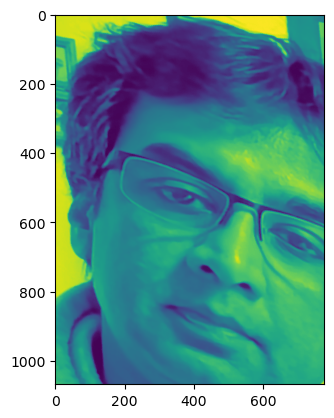

Magnitude of required change of A is: 48116.642349607064
Number of iterations: 8
3. img_warped input
img:
[[176 176 176 ... 125 125 125]
 [176 176 176 ... 125 125 125]
 [176 176 176 ... 126 126 126]
 ...
 [ 22  21  21 ...  47  47  47]
 [ 22  22  22 ...  47  48  48]
 [ 23  23  22 ...  48  48  48]]
<class 'numpy.ndarray'>
(1936, 2904)
A:
[[ 7.53835346e-01 -8.07698918e-02  1.23458359e+03]
 [-1.42919956e-01  8.94216618e-01  1.38579678e+02]
 [ 6.05044021e-19 -9.45655170e-19  1.00000000e+00]]
<class 'numpy.ndarray'>
(3, 3)
output_size:
(1068, 777)
<class 'tuple'>
3. img_warped output
img_warped:
[[223. 223. 223. ... 105. 105. 105.]
 [223. 223. 223. ... 106. 106. 106.]
 [223. 223. 223. ... 107. 106. 107.]
 ...
 [166. 167. 167. ... 231. 230. 230.]
 [168. 168. 167. ... 229. 227. 227.]
 [169. 169. 168. ... 226. 226. 225.]]
<class 'numpy.ndarray'>
(1068, 777)
visualization for checking warpred function...


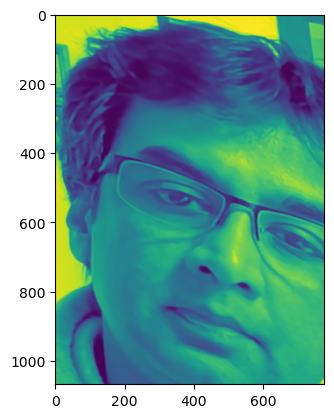

Magnitude of required change of A is: 46340.40205911036
Number of iterations: 9
3. img_warped input
img:
[[176 176 176 ... 125 125 125]
 [176 176 176 ... 125 125 125]
 [176 176 176 ... 126 126 126]
 ...
 [ 22  21  21 ...  47  47  47]
 [ 22  22  22 ...  47  48  48]
 [ 23  23  22 ...  48  48  48]]
<class 'numpy.ndarray'>
(1936, 2904)
A:
[[ 7.67385341e-01 -1.00537049e-01  1.24644058e+03]
 [-1.26662555e-01  8.85834363e-01  1.33899431e+02]
 [ 5.97051964e-19 -9.49364230e-19  1.00000000e+00]]
<class 'numpy.ndarray'>
(3, 3)
output_size:
(1068, 777)
<class 'tuple'>
3. img_warped output
img_warped:
[[222. 222. 222. ... 107. 107. 107.]
 [222. 222. 222. ... 107. 107. 107.]
 [223. 223. 222. ... 107. 107. 107.]
 ...
 [169. 169. 169. ... 232. 230. 230.]
 [170. 170. 170. ... 230. 227. 227.]
 [171. 171. 171. ... 227. 225. 226.]]
<class 'numpy.ndarray'>
(1068, 777)
visualization for checking warpred function...


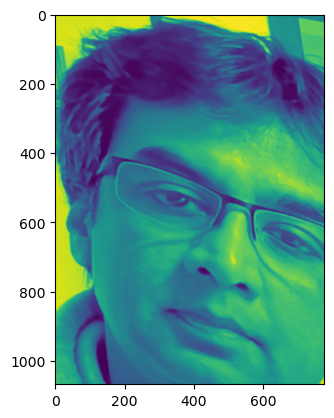

Magnitude of required change of A is: 45006.8497342349
Number of iterations: 10
3. img_warped input
img:
[[176 176 176 ... 125 125 125]
 [176 176 176 ... 125 125 125]
 [176 176 176 ... 126 126 126]
 ...
 [ 22  21  21 ...  47  47  47]
 [ 22  22  22 ...  47  48  48]
 [ 23  23  22 ...  48  48  48]]
<class 'numpy.ndarray'>
(1936, 2904)
A:
[[ 7.84444915e-01 -1.19131257e-01  1.25644176e+03]
 [-1.09699403e-01  8.88882643e-01  1.22582588e+02]
 [ 5.90502634e-19 -9.63810282e-19  1.00000000e+00]]
<class 'numpy.ndarray'>
(3, 3)
output_size:
(1068, 777)
<class 'tuple'>
3. img_warped output
img_warped:
[[222. 222. 222. ... 110. 111. 111.]
 [222. 222. 222. ... 111. 111. 111.]
 [222. 222. 222. ... 111. 110. 110.]
 ...
 [176. 176. 178. ... 222. 222. 223.]
 [176. 176. 178. ... 226. 226. 226.]
 [173. 176. 178. ... 231. 231. 231.]]
<class 'numpy.ndarray'>
(1068, 777)
visualization for checking warpred function...


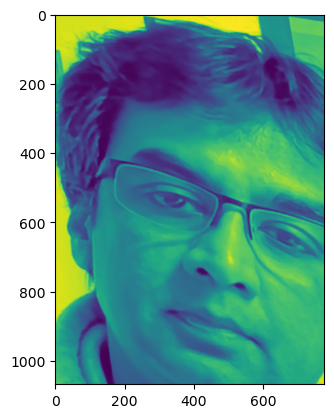

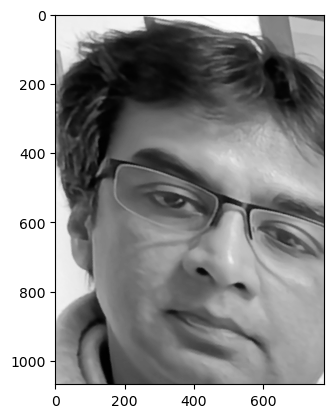

Magnitude of required change of A is: 43383.32706236349
Number of iterations: 11
4. Inverse Compositional Image Alignment output
refined A:
[[ 7.84444915e-01 -1.19131257e-01  1.25644176e+03]
 [-1.09699403e-01  8.88882643e-01  1.22582588e+02]
 [ 5.90502634e-19 -9.63810282e-19  1.00000000e+00]]
<class 'numpy.ndarray'>
(3, 3)
3. img_warped input
img:
[[176 176 176 ... 125 125 125]
 [176 176 176 ... 125 125 125]
 [176 176 176 ... 126 126 126]
 ...
 [ 22  21  21 ...  47  47  47]
 [ 22  22  22 ...  47  48  48]
 [ 23  23  22 ...  48  48  48]]
<class 'numpy.ndarray'>
(1936, 2904)
A:
[[ 9.37761086e-01  2.10698689e-01  8.88832688e+02]
 [-2.38143347e-01  9.40170628e-01  1.89267407e+02]
 [ 8.13151629e-19 -8.13151629e-19  1.00000000e+00]]
<class 'numpy.ndarray'>
(3, 3)
output_size:
(1068, 777)
<class 'tuple'>
3. img_warped output
img_warped:
[[205. 205. 205. ... 232. 232. 232.]
 [205. 205. 205. ... 232. 233. 232.]
 [206. 206. 206. ... 232. 233. 233.]
 ...
 [140. 137. 135. ... 164. 167. 171.]
 [140.

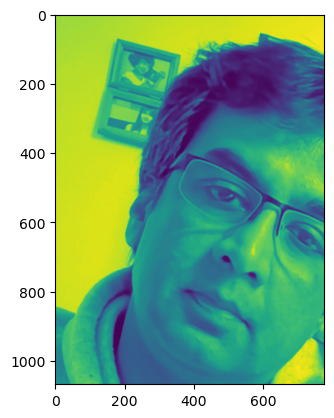

3. img_warped input
img:
[[176 176 176 ... 125 125 125]
 [176 176 176 ... 125 125 125]
 [176 176 176 ... 126 126 126]
 ...
 [ 22  21  21 ...  47  47  47]
 [ 22  22  22 ...  47  48  48]
 [ 23  23  22 ...  48  48  48]]
<class 'numpy.ndarray'>
(1936, 2904)
A:
[[ 7.84444915e-01 -1.19131257e-01  1.25644176e+03]
 [-1.09699403e-01  8.88882643e-01  1.22582588e+02]
 [ 5.90502634e-19 -9.63810282e-19  1.00000000e+00]]
<class 'numpy.ndarray'>
(3, 3)
output_size:
(1068, 777)
<class 'tuple'>
3. img_warped output
img_warped:
[[222. 222. 222. ... 110. 111. 111.]
 [222. 222. 222. ... 111. 111. 111.]
 [222. 222. 222. ... 111. 110. 110.]
 ...
 [176. 176. 178. ... 222. 222. 223.]
 [176. 176. 178. ... 226. 226. 226.]
 [173. 176. 178. ... 231. 231. 231.]]
<class 'numpy.ndarray'>
(1068, 777)
visualization for checking warpred function...


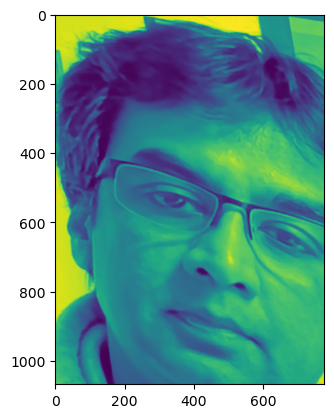

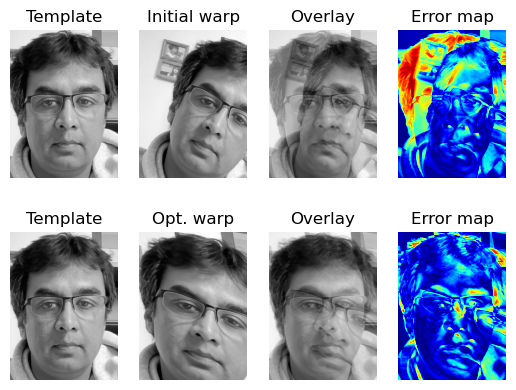

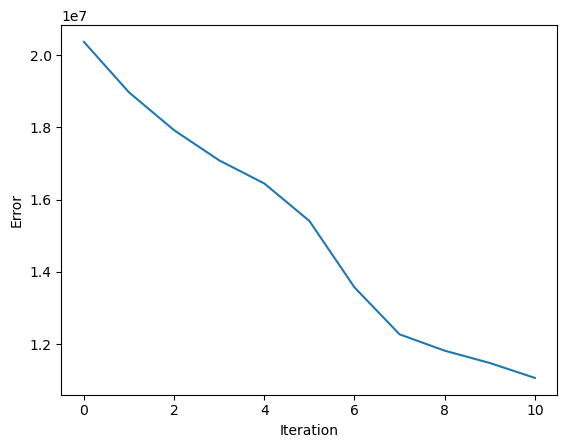

4. Inverse Compositional Image Alignment input
template:
[[213 213 213 ... 179 180 181]
 [213 213 213 ... 179 180 182]
 [213 213 213 ... 179 180 181]
 ...
 [107 106 104 ... 191 190 192]
 [108 106 104 ... 191 191 192]
 [109 107 105 ... 191 191 193]]
<class 'numpy.ndarray'>
(1068, 777)
target:
[[174 174 174 ... 123 123 123]
 [174 174 174 ... 123 123 124]
 [174 174 174 ... 124 124 124]
 ...
 [ 18  18  18 ...  43  44  44]
 [ 18  19  19 ...  43  44  44]
 [ 19  19  19 ...  43  44  44]]
<class 'numpy.ndarray'>
(1936, 2904)
A:
[[ 9.37761086e-01  2.10698689e-01  8.88832688e+02]
 [-2.38143347e-01  9.40170628e-01  1.89267407e+02]
 [ 8.13151629e-19 -8.13151629e-19  1.00000000e+00]]
<class 'numpy.ndarray'>
(3, 3)
3. img_warped input
img:
[[174 174 174 ... 123 123 123]
 [174 174 174 ... 123 123 124]
 [174 174 174 ... 124 124 124]
 ...
 [ 18  18  18 ...  43  44  44]
 [ 18  19  19 ...  43  44  44]
 [ 19  19  19 ...  43  44  44]]
<class 'numpy.ndarray'>
(1936, 2904)
A:
[[ 9.37761086e-01  2.10698689e-01

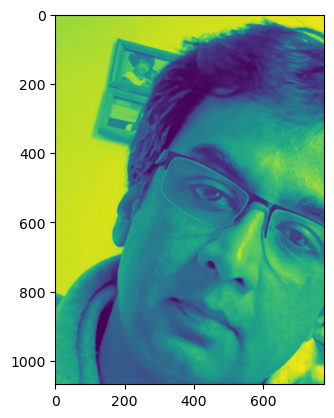

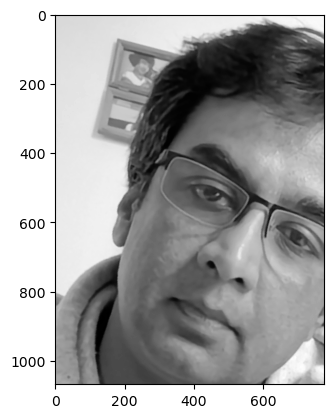

Magnitude of required change of A is: 74692.87356903602
Number of iterations: 1
3. img_warped input
img:
[[174 174 174 ... 123 123 123]
 [174 174 174 ... 123 123 124]
 [174 174 174 ... 124 124 124]
 ...
 [ 18  18  18 ...  43  44  44]
 [ 18  19  19 ...  43  44  44]
 [ 19  19  19 ...  43  44  44]]
<class 'numpy.ndarray'>
(1936, 2904)
A:
[[ 9.22560455e-01  1.36864426e-01  9.49879662e+02]
 [-2.15977574e-01  8.93152311e-01  2.01292385e+02]
 [ 7.81625188e-19 -8.11262388e-19  1.00000000e+00]]
<class 'numpy.ndarray'>
(3, 3)
output_size:
(1068, 777)
<class 'tuple'>
3. img_warped output
img_warped:
[[207. 207. 207. ... 238. 238. 238.]
 [207. 207. 207. ... 238. 238. 238.]
 [207. 207. 207. ... 238. 238. 238.]
 ...
 [166. 166. 166. ... 207. 209. 211.]
 [166. 167. 167. ... 207. 209. 211.]
 [166. 167. 167. ... 207. 209. 210.]]
<class 'numpy.ndarray'>
(1068, 777)
visualization for checking warpred function...


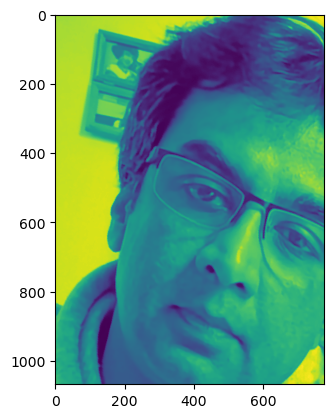

Magnitude of required change of A is: 70197.40743788192
Number of iterations: 2
3. img_warped input
img:
[[174 174 174 ... 123 123 123]
 [174 174 174 ... 123 123 124]
 [174 174 174 ... 124 124 124]
 ...
 [ 18  18  18 ...  43  44  44]
 [ 18  19  19 ...  43  44  44]
 [ 19  19  19 ...  43  44  44]]
<class 'numpy.ndarray'>
(1936, 2904)
A:
[[ 9.00408881e-01  8.58239366e-02  1.00008219e+03]
 [-2.06630986e-01  8.79765950e-01  1.98853582e+02]
 [ 7.58687742e-19 -8.29114912e-19  1.00000000e+00]]
<class 'numpy.ndarray'>
(3, 3)
output_size:
(1068, 777)
<class 'tuple'>
3. img_warped output
img_warped:
[[209. 209. 209. ... 236. 236. 235.]
 [209. 209. 209. ... 236. 236. 235.]
 [209. 209. 209. ... 236. 236. 236.]
 ...
 [168. 169. 167. ... 219. 219. 219.]
 [168. 169. 167. ... 219. 218. 218.]
 [168. 167. 167. ... 218. 218. 217.]]
<class 'numpy.ndarray'>
(1068, 777)
visualization for checking warpred function...


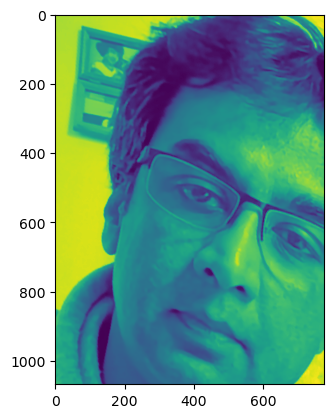

Magnitude of required change of A is: 67027.2908672281
Number of iterations: 3
3. img_warped input
img:
[[174 174 174 ... 123 123 123]
 [174 174 174 ... 123 123 124]
 [174 174 174 ... 124 124 124]
 ...
 [ 18  18  18 ...  43  44  44]
 [ 18  19  19 ...  43  44  44]
 [ 19  19  19 ...  43  44  44]]
<class 'numpy.ndarray'>
(1936, 2904)
A:
[[ 8.80773445e-01  3.44242922e-02  1.04925319e+03]
 [-1.94306788e-01  8.82911737e-01  1.84408882e+02]
 [ 7.34307592e-19 -8.63755803e-19  1.00000000e+00]]
<class 'numpy.ndarray'>
(3, 3)
output_size:
(1068, 777)
<class 'tuple'>
3. img_warped output
img_warped:
[[212. 213. 213. ... 124. 124. 124.]
 [212. 212. 213. ... 124. 124. 124.]
 [212. 212. 213. ... 124. 124. 124.]
 ...
 [156. 156. 155. ... 239. 239. 239.]
 [156. 156. 156. ... 239. 239. 239.]
 [156. 157. 157. ... 240. 240. 239.]]
<class 'numpy.ndarray'>
(1068, 777)
visualization for checking warpred function...


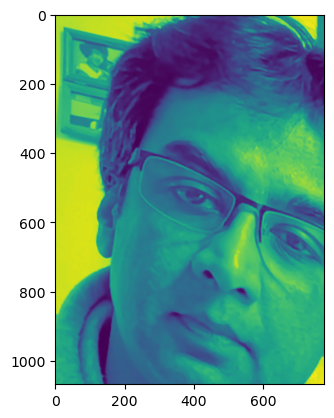

Magnitude of required change of A is: 63328.2040721194
Number of iterations: 4
3. img_warped input
img:
[[174 174 174 ... 123 123 123]
 [174 174 174 ... 123 123 124]
 [174 174 174 ... 124 124 124]
 ...
 [ 18  18  18 ...  43  44  44]
 [ 18  19  19 ...  43  44  44]
 [ 19  19  19 ...  43  44  44]]
<class 'numpy.ndarray'>
(1936, 2904)
A:
[[ 8.56144789e-01 -1.59906546e-02  1.10151869e+03]
 [-1.77706983e-01  8.96862230e-01  1.62222978e+02]
 [ 7.02583551e-19 -9.08621812e-19  1.00000000e+00]]
<class 'numpy.ndarray'>
(3, 3)
output_size:
(1068, 777)
<class 'tuple'>
3. img_warped output
img_warped:
[[214. 214. 215. ... 120. 120. 120.]
 [214. 214. 215. ... 120. 120. 120.]
 [214. 214. 215. ... 121. 120. 120.]
 ...
 [157. 157. 156. ... 232. 233. 233.]
 [157. 157. 156. ... 232. 232. 233.]
 [156. 156. 156. ... 232. 232. 233.]]
<class 'numpy.ndarray'>
(1068, 777)
visualization for checking warpred function...


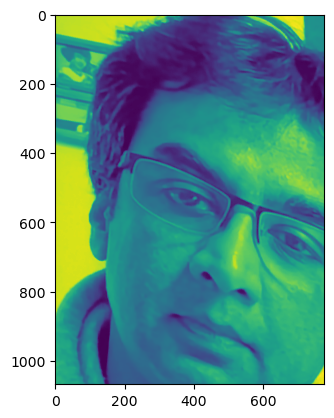

Magnitude of required change of A is: 58509.97347461371
Number of iterations: 5
3. img_warped input
img:
[[174 174 174 ... 123 123 123]
 [174 174 174 ... 123 123 124]
 [174 174 174 ... 124 124 124]
 ...
 [ 18  18  18 ...  43  44  44]
 [ 18  19  19 ...  43  44  44]
 [ 19  19  19 ...  43  44  44]]
<class 'numpy.ndarray'>
(1936, 2904)
A:
[[ 8.26859372e-01 -6.09966122e-02  1.15429472e+03]
 [-1.60322742e-01  9.18177086e-01  1.35218264e+02]
 [ 6.67220552e-19 -9.57554677e-19  1.00000000e+00]]
<class 'numpy.ndarray'>
(3, 3)
output_size:
(1068, 777)
<class 'tuple'>
3. img_warped output
img_warped:
[[218. 218. 218. ...  85.  86.  86.]
 [217. 217. 218. ...  77.  78.  78.]
 [217. 217. 218. ...  69.  70.  70.]
 ...
 [155. 154. 152. ... 229. 229. 228.]
 [154. 153. 151. ... 227. 228. 228.]
 [154. 152. 150. ... 226. 227. 227.]]
<class 'numpy.ndarray'>
(1068, 777)
visualization for checking warpred function...


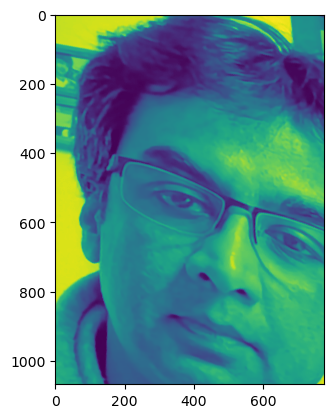

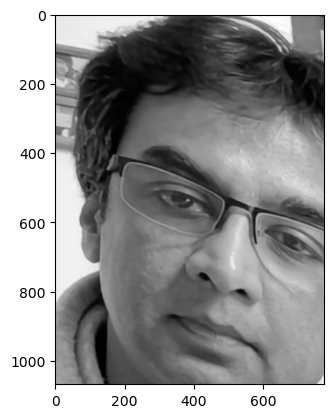

Magnitude of required change of A is: 52295.539073615066
Number of iterations: 6
3. img_warped input
img:
[[174 174 174 ... 123 123 123]
 [174 174 174 ... 123 123 124]
 [174 174 174 ... 124 124 124]
 ...
 [ 18  18  18 ...  43  44  44]
 [ 18  19  19 ...  43  44  44]
 [ 19  19  19 ...  43  44  44]]
<class 'numpy.ndarray'>
(1936, 2904)
A:
[[ 8.07009059e-01 -9.90008133e-02  1.19826186e+03]
 [-1.32358633e-01  9.41245669e-01  1.00904370e+02]
 [ 6.27034614e-19 -1.00395572e-18  1.00000000e+00]]
<class 'numpy.ndarray'>
(3, 3)
output_size:
(1068, 777)
<class 'tuple'>
3. img_warped output
img_warped:
[[218. 218. 218. ... 185. 183. 183.]
 [218. 218. 218. ... 185. 183. 183.]
 [218. 218. 218. ... 185. 183. 183.]
 ...
 [156. 156. 156. ... 225. 228. 229.]
 [155. 156. 155. ... 225. 228. 230.]
 [155. 155. 155. ... 225. 229. 230.]]
<class 'numpy.ndarray'>
(1068, 777)
visualization for checking warpred function...


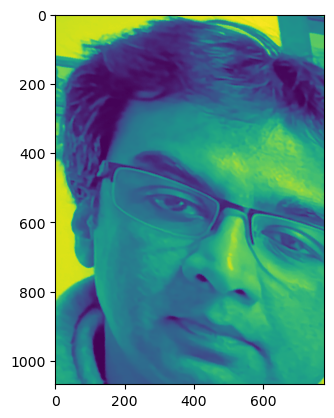

Magnitude of required change of A is: 46714.78125818422
Number of iterations: 7
3. img_warped input
img:
[[174 174 174 ... 123 123 123]
 [174 174 174 ... 123 123 124]
 [174 174 174 ... 124 124 124]
 ...
 [ 18  18  18 ...  43  44  44]
 [ 18  19  19 ...  43  44  44]
 [ 19  19  19 ...  43  44  44]]
<class 'numpy.ndarray'>
(1936, 2904)
A:
[[ 8.09997070e-01 -1.35265665e-01  1.22688837e+03]
 [-1.09027670e-01  9.46403772e-01  8.35870963e+01]
 [ 6.05483075e-19 -1.03134153e-18  1.00000000e+00]]
<class 'numpy.ndarray'>
(3, 3)
output_size:
(1068, 777)
<class 'tuple'>
3. img_warped output
img_warped:
[[220. 220. 220. ... 154. 154. 152.]
 [220. 220. 220. ... 154. 154. 152.]
 [220. 220. 220. ... 163. 160. 157.]
 ...
 [165. 164. 162. ... 206. 206. 211.]
 [165. 163. 163. ... 207. 207. 208.]
 [164. 162. 162. ... 205. 206. 207.]]
<class 'numpy.ndarray'>
(1068, 777)
visualization for checking warpred function...


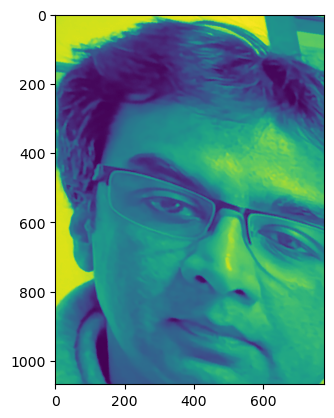

Magnitude of required change of A is: 44040.572702906575
Number of iterations: 8
3. img_warped input
img:
[[174 174 174 ... 123 123 123]
 [174 174 174 ... 123 123 124]
 [174 174 174 ... 124 124 124]
 ...
 [ 18  18  18 ...  43  44  44]
 [ 18  19  19 ...  43  44  44]
 [ 19  19  19 ...  43  44  44]]
<class 'numpy.ndarray'>
(1936, 2904)
A:
[[ 8.28640172e-01 -1.56973615e-01  1.23829196e+03]
 [-8.57469214e-02  9.53238256e-01  6.78659410e+01]
 [ 5.93572411e-19 -1.05148960e-18  1.00000000e+00]]
<class 'numpy.ndarray'>
(3, 3)
output_size:
(1068, 777)
<class 'tuple'>
3. img_warped output
img_warped:
[[220. 220. 220. ... 135. 135. 134.]
 [219. 220. 220. ... 135. 146. 145.]
 [219. 219. 219. ... 160. 157. 156.]
 ...
 [151. 153. 154. ... 209. 211. 212.]
 [151. 153. 154. ... 209. 211. 212.]
 [151. 153. 153. ... 210. 211. 212.]]
<class 'numpy.ndarray'>
(1068, 777)
visualization for checking warpred function...


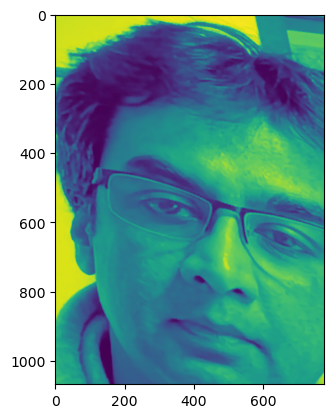

Magnitude of required change of A is: 42455.5436309559
Number of iterations: 9
3. img_warped input
img:
[[174 174 174 ... 123 123 123]
 [174 174 174 ... 123 123 124]
 [174 174 174 ... 124 124 124]
 ...
 [ 18  18  18 ...  43  44  44]
 [ 18  19  19 ...  43  44  44]
 [ 19  19  19 ...  43  44  44]]
<class 'numpy.ndarray'>
(1936, 2904)
A:
[[ 8.42700301e-01 -1.62123363e-01  1.24179006e+03]
 [-7.84951460e-02  9.51793825e-01  6.78720475e+01]
 [ 5.94918212e-19 -1.05319682e-18  1.00000000e+00]]
<class 'numpy.ndarray'>
(3, 3)
output_size:
(1068, 777)
<class 'tuple'>
3. img_warped output
img_warped:
[[220. 220. 220. ... 167. 167. 166.]
 [220. 220. 220. ... 157. 156. 130.]
 [220. 220. 220. ... 131. 130. 130.]
 ...
 [151. 152. 152. ... 231. 231. 232.]
 [151. 152. 152. ... 231. 231. 232.]
 [151. 151. 152. ... 231. 231. 232.]]
<class 'numpy.ndarray'>
(1068, 777)
visualization for checking warpred function...


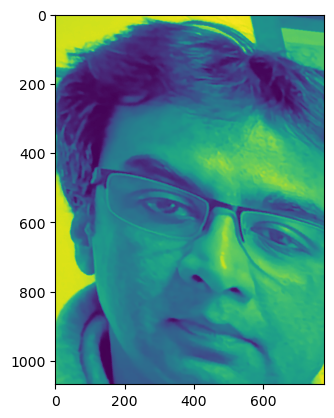

Magnitude of required change of A is: 41703.387128625414
Number of iterations: 10
3. img_warped input
img:
[[174 174 174 ... 123 123 123]
 [174 174 174 ... 123 123 124]
 [174 174 174 ... 124 124 124]
 ...
 [ 18  18  18 ...  43  44  44]
 [ 18  19  19 ...  43  44  44]
 [ 19  19  19 ...  43  44  44]]
<class 'numpy.ndarray'>
(1936, 2904)
A:
[[ 8.63462414e-01 -1.61685667e-01  1.23837984e+03]
 [-6.79800807e-02  9.56848142e-01  6.20339546e+01]
 [ 5.97099318e-19 -1.05799406e-18  1.00000000e+00]]
<class 'numpy.ndarray'>
(3, 3)
output_size:
(1068, 777)
<class 'tuple'>
3. img_warped output
img_warped:
[[220. 220. 219. ... 142. 144. 118.]
 [220. 220. 219. ... 115. 115. 118.]
 [219. 219. 218. ...  77.  79.  81.]
 ...
 [150. 150. 151. ... 223. 223. 221.]
 [150. 150. 151. ... 225. 224. 222.]
 [150. 150. 151. ... 226. 225. 224.]]
<class 'numpy.ndarray'>
(1068, 777)
visualization for checking warpred function...


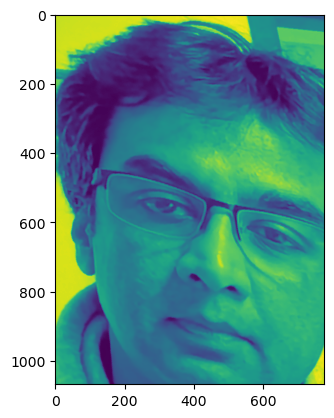

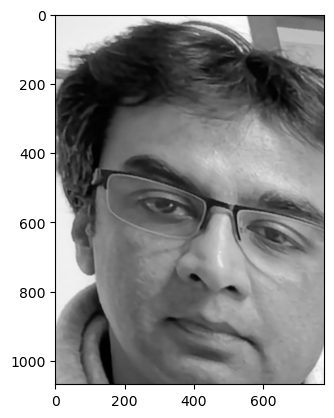

Magnitude of required change of A is: 41122.96195557903
Number of iterations: 11
4. Inverse Compositional Image Alignment output
refined A:
[[ 8.63462414e-01 -1.61685667e-01  1.23837984e+03]
 [-6.79800807e-02  9.56848142e-01  6.20339546e+01]
 [ 5.97099318e-19 -1.05799406e-18  1.00000000e+00]]
<class 'numpy.ndarray'>
(3, 3)
3. img_warped input
img:
[[174 174 174 ... 123 123 123]
 [174 174 174 ... 123 123 124]
 [174 174 174 ... 124 124 124]
 ...
 [ 18  18  18 ...  43  44  44]
 [ 18  19  19 ...  43  44  44]
 [ 19  19  19 ...  43  44  44]]
<class 'numpy.ndarray'>
(1936, 2904)
A:
[[ 9.37761086e-01  2.10698689e-01  8.88832688e+02]
 [-2.38143347e-01  9.40170628e-01  1.89267407e+02]
 [ 8.13151629e-19 -8.13151629e-19  1.00000000e+00]]
<class 'numpy.ndarray'>
(3, 3)
output_size:
(1068, 777)
<class 'tuple'>
3. img_warped output
img_warped:
[[204. 204. 204. ... 234. 234. 234.]
 [204. 204. 204. ... 234. 234. 234.]
 [204. 204. 204. ... 234. 235. 235.]
 ...
 [163. 162. 161. ... 185. 186. 192.]
 [163.

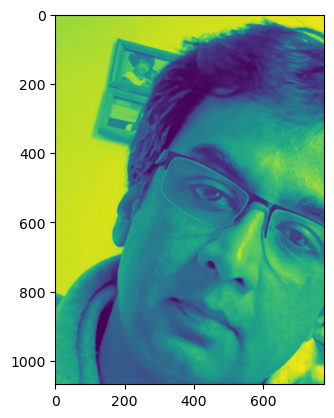

3. img_warped input
img:
[[174 174 174 ... 123 123 123]
 [174 174 174 ... 123 123 124]
 [174 174 174 ... 124 124 124]
 ...
 [ 18  18  18 ...  43  44  44]
 [ 18  19  19 ...  43  44  44]
 [ 19  19  19 ...  43  44  44]]
<class 'numpy.ndarray'>
(1936, 2904)
A:
[[ 8.63462414e-01 -1.61685667e-01  1.23837984e+03]
 [-6.79800807e-02  9.56848142e-01  6.20339546e+01]
 [ 5.97099318e-19 -1.05799406e-18  1.00000000e+00]]
<class 'numpy.ndarray'>
(3, 3)
output_size:
(1068, 777)
<class 'tuple'>
3. img_warped output
img_warped:
[[220. 220. 219. ... 142. 144. 118.]
 [220. 220. 219. ... 115. 115. 118.]
 [219. 219. 218. ...  77.  79.  81.]
 ...
 [150. 150. 151. ... 223. 223. 221.]
 [150. 150. 151. ... 225. 224. 222.]
 [150. 150. 151. ... 226. 225. 224.]]
<class 'numpy.ndarray'>
(1068, 777)
visualization for checking warpred function...


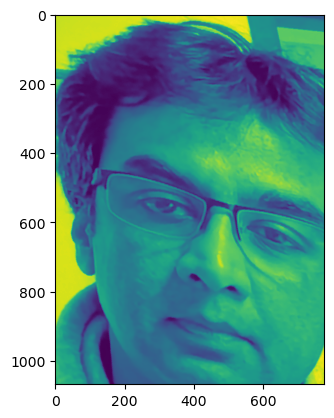

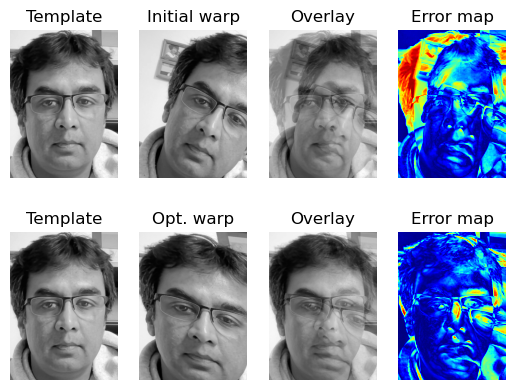

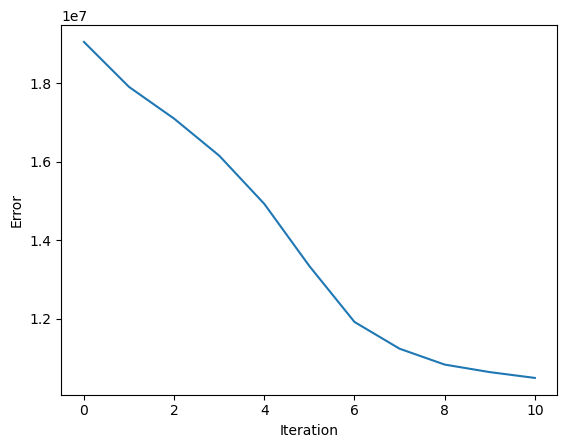

4. Inverse Compositional Image Alignment input
template:
[[213 213 213 ... 179 180 181]
 [213 213 213 ... 179 180 182]
 [213 213 213 ... 179 180 181]
 ...
 [107 106 104 ... 191 190 192]
 [108 106 104 ... 191 191 192]
 [109 107 105 ... 191 191 193]]
<class 'numpy.ndarray'>
(1068, 777)
target:
[[177 176 176 ... 127 128 128]
 [177 176 176 ... 127 127 128]
 [177 176 176 ... 127 127 127]
 ...
 [ 18  18  18 ...  45  46  47]
 [ 18  18  18 ...  45  46  47]
 [ 18  18  18 ...  45  46  47]]
<class 'numpy.ndarray'>
(1936, 2904)
A:
[[ 9.37761086e-01  2.10698689e-01  8.88832688e+02]
 [-2.38143347e-01  9.40170628e-01  1.89267407e+02]
 [ 8.13151629e-19 -8.13151629e-19  1.00000000e+00]]
<class 'numpy.ndarray'>
(3, 3)
3. img_warped input
img:
[[177 176 176 ... 127 128 128]
 [177 176 176 ... 127 127 128]
 [177 176 176 ... 127 127 127]
 ...
 [ 18  18  18 ...  45  46  47]
 [ 18  18  18 ...  45  46  47]
 [ 18  18  18 ...  45  46  47]]
<class 'numpy.ndarray'>
(1936, 2904)
A:
[[ 9.37761086e-01  2.10698689e-01

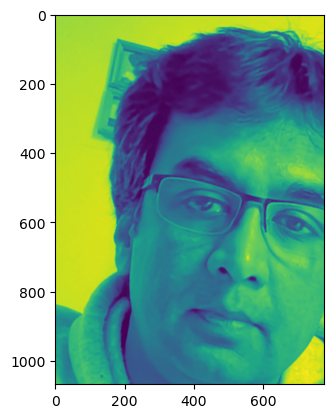

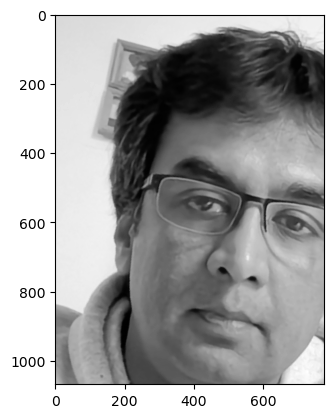

Magnitude of required change of A is: 74122.59989368965
Number of iterations: 1
3. img_warped input
img:
[[177 176 176 ... 127 128 128]
 [177 176 176 ... 127 127 128]
 [177 176 176 ... 127 127 127]
 ...
 [ 18  18  18 ...  45  46  47]
 [ 18  18  18 ...  45  46  47]
 [ 18  18  18 ...  45  46  47]]
<class 'numpy.ndarray'>
(1936, 2904)
A:
[[ 9.08697855e-01  1.54193099e-01  9.52363797e+02]
 [-2.30831358e-01  8.97939625e-01  2.05442513e+02]
 [ 7.88019048e-19 -8.05444369e-19  1.00000000e+00]]
<class 'numpy.ndarray'>
(3, 3)
output_size:
(1068, 777)
<class 'tuple'>
3. img_warped output
img_warped:
[[209. 209. 209. ... 231. 231. 231.]
 [209. 209. 209. ... 231. 231. 231.]
 [209. 209. 209. ... 231. 231. 231.]
 ...
 [148. 147. 145. ... 229. 230. 228.]
 [149. 146. 145. ... 230. 231. 228.]
 [149. 148. 146. ... 231. 232. 230.]]
<class 'numpy.ndarray'>
(1068, 777)
visualization for checking warpred function...


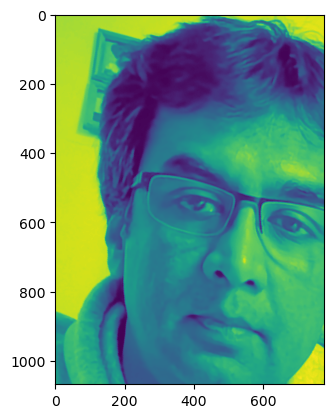

Magnitude of required change of A is: 66807.30104561926
Number of iterations: 2
3. img_warped input
img:
[[177 176 176 ... 127 128 128]
 [177 176 176 ... 127 127 128]
 [177 176 176 ... 127 127 127]
 ...
 [ 18  18  18 ...  45  46  47]
 [ 18  18  18 ...  45  46  47]
 [ 18  18  18 ...  45  46  47]]
<class 'numpy.ndarray'>
(1936, 2904)
A:
[[ 8.72934813e-01  1.04500977e-01  1.01441698e+03]
 [-2.24025766e-01  8.85528988e-01  2.02460789e+02]
 [ 7.59289565e-19 -8.23448723e-19  1.00000000e+00]]
<class 'numpy.ndarray'>
(3, 3)
output_size:
(1068, 777)
<class 'tuple'>
3. img_warped output
img_warped:
[[211. 211. 211. ... 231. 231. 231.]
 [211. 211. 211. ... 231. 231. 231.]
 [211. 211. 211. ... 231. 231. 231.]
 ...
 [121. 119. 119. ... 230. 230. 230.]
 [121. 120. 118. ... 230. 231. 231.]
 [121. 120. 119. ... 231. 231. 232.]]
<class 'numpy.ndarray'>
(1068, 777)
visualization for checking warpred function...


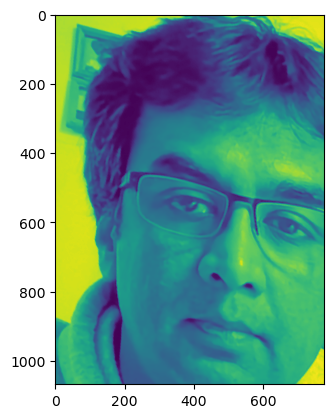

Magnitude of required change of A is: 58421.809198278
Number of iterations: 3
3. img_warped input
img:
[[177 176 176 ... 127 128 128]
 [177 176 176 ... 127 127 128]
 [177 176 176 ... 127 127 127]
 ...
 [ 18  18  18 ...  45  46  47]
 [ 18  18  18 ...  45  46  47]
 [ 18  18  18 ...  45  46  47]]
<class 'numpy.ndarray'>
(1936, 2904)
A:
[[ 8.27583613e-01  7.08725800e-02  1.07140158e+03]
 [-2.06728725e-01  8.92850267e-01  1.82144227e+02]
 [ 7.14171811e-19 -8.51387306e-19  1.00000000e+00]]
<class 'numpy.ndarray'>
(3, 3)
output_size:
(1068, 777)
<class 'tuple'>
3. img_warped output
img_warped:
[[214. 213. 214. ... 224. 221. 220.]
 [214. 213. 214. ... 224. 221. 220.]
 [215. 215. 215. ... 224. 223. 220.]
 ...
 [114. 122. 122. ... 238. 239. 239.]
 [110. 117. 132. ... 237. 238. 238.]
 [108. 113. 125. ... 238. 238. 238.]]
<class 'numpy.ndarray'>
(1068, 777)
visualization for checking warpred function...


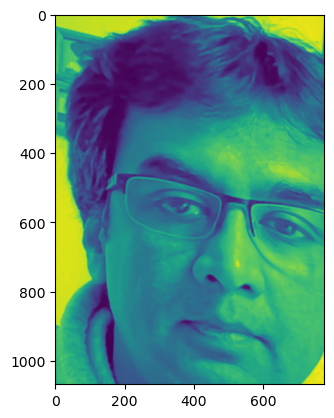

Magnitude of required change of A is: 48707.996951219415
Number of iterations: 4
3. img_warped input
img:
[[177 176 176 ... 127 128 128]
 [177 176 176 ... 127 127 128]
 [177 176 176 ... 127 127 127]
 ...
 [ 18  18  18 ...  45  46  47]
 [ 18  18  18 ...  45  46  47]
 [ 18  18  18 ...  45  46  47]]
<class 'numpy.ndarray'>
(1936, 2904)
A:
[[ 7.96706332e-01  6.09354573e-02  1.10590346e+03]
 [-1.84727875e-01  9.19465432e-01  1.50743514e+02]
 [ 6.73206895e-19 -8.84148373e-19  1.00000000e+00]]
<class 'numpy.ndarray'>
(3, 3)
output_size:
(1068, 777)
<class 'tuple'>
3. img_warped output
img_warped:
[[214. 214. 214. ... 122. 122. 121.]
 [215. 214. 214. ... 122. 122. 121.]
 [215. 215. 215. ... 122. 121. 121.]
 ...
 [166. 167. 167. ... 242. 243. 244.]
 [166. 167. 167. ... 242. 242. 243.]
 [166. 167. 168. ... 241. 242. 242.]]
<class 'numpy.ndarray'>
(1068, 777)
visualization for checking warpred function...


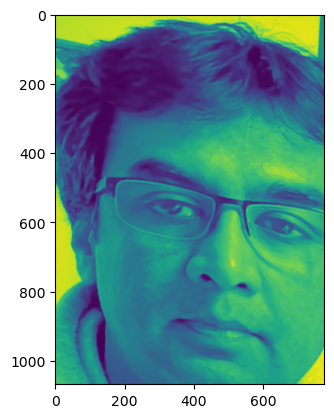

Magnitude of required change of A is: 43414.96100424368
Number of iterations: 5
3. img_warped input
img:
[[177 176 176 ... 127 128 128]
 [177 176 176 ... 127 127 128]
 [177 176 176 ... 127 127 127]
 ...
 [ 18  18  18 ...  45  46  47]
 [ 18  18  18 ...  45  46  47]
 [ 18  18  18 ...  45  46  47]]
<class 'numpy.ndarray'>
(1936, 2904)
A:
[[ 8.34659737e-01  4.02622914e-02  1.10698503e+03]
 [-1.77170878e-01  9.18587508e-01  1.47297232e+02]
 [ 6.88884197e-19 -8.95933228e-19  1.00000000e+00]]
<class 'numpy.ndarray'>
(3, 3)
output_size:
(1068, 777)
<class 'tuple'>
3. img_warped output
img_warped:
[[214. 214. 214. ... 118. 118. 118.]
 [214. 214. 214. ... 118. 118. 118.]
 [214. 214. 215. ... 118. 118. 118.]
 ...
 [154. 158. 159. ... 227. 227. 227.]
 [157. 157. 157. ... 229. 228. 227.]
 [154. 157. 157. ... 232. 231. 229.]]
<class 'numpy.ndarray'>
(1068, 777)
visualization for checking warpred function...


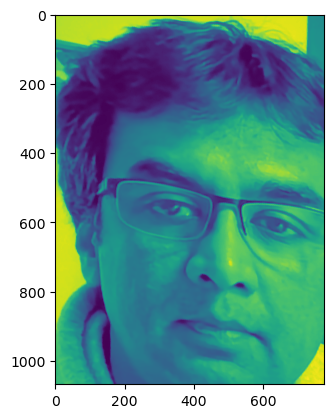

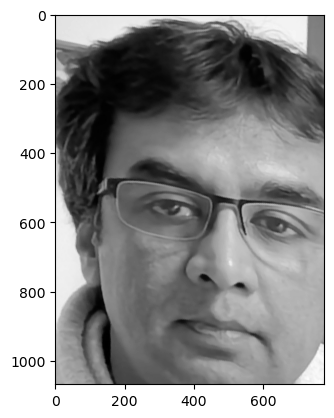

Magnitude of required change of A is: 42503.48852741384
Number of iterations: 6
3. img_warped input
img:
[[177 176 176 ... 127 128 128]
 [177 176 176 ... 127 127 128]
 [177 176 176 ... 127 127 127]
 ...
 [ 18  18  18 ...  45  46  47]
 [ 18  18  18 ...  45  46  47]
 [ 18  18  18 ...  45  46  47]]
<class 'numpy.ndarray'>
(1936, 2904)
A:
[[ 8.35708224e-01  3.75211733e-02  1.12099492e+03]
 [-1.59721985e-01  9.23372721e-01  1.35111006e+02]
 [ 6.72039423e-19 -9.02408168e-19  1.00000000e+00]]
<class 'numpy.ndarray'>
(3, 3)
output_size:
(1068, 777)
<class 'tuple'>
3. img_warped output
img_warped:
[[215. 215. 215. ... 118. 117. 117.]
 [215. 215. 215. ... 118. 118. 118.]
 [215. 215. 215. ... 119. 118. 117.]
 ...
 [165. 165. 164. ... 233. 232. 232.]
 [165. 164. 164. ... 233. 233. 233.]
 [164. 164. 163. ... 234. 234. 233.]]
<class 'numpy.ndarray'>
(1068, 777)
visualization for checking warpred function...


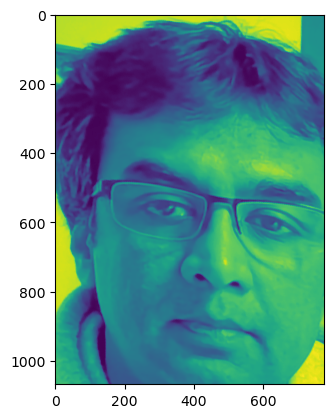

Magnitude of required change of A is: 41342.52607183069
Number of iterations: 7
3. img_warped input
img:
[[177 176 176 ... 127 128 128]
 [177 176 176 ... 127 127 128]
 [177 176 176 ... 127 127 127]
 ...
 [ 18  18  18 ...  45  46  47]
 [ 18  18  18 ...  45  46  47]
 [ 18  18  18 ...  45  46  47]]
<class 'numpy.ndarray'>
(1936, 2904)
A:
[[ 8.98470212e-01  3.24298837e-02  1.09946656e+03]
 [-1.62994484e-01  9.27544855e-01  1.37195619e+02]
 [ 7.13768050e-19 -9.09708439e-19  1.00000000e+00]]
<class 'numpy.ndarray'>
(3, 3)
output_size:
(1068, 777)
<class 'tuple'>
3. img_warped output
img_warped:
[[214. 214. 214. ...  92.  92.  92.]
 [214. 214. 214. ...  91.  92.  92.]
 [214. 214. 214. ...  86.  87.  92.]
 ...
 [103. 102.  99. ... 212. 210. 208.]
 [104. 103. 101. ... 210. 208. 208.]
 [104. 103. 102. ... 209. 206. 204.]]
<class 'numpy.ndarray'>
(1068, 777)
visualization for checking warpred function...


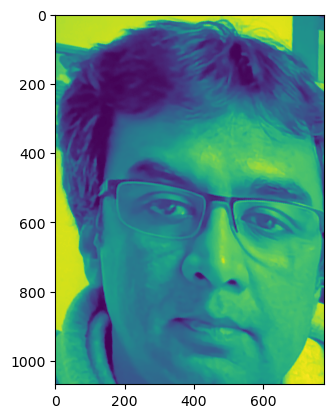

Magnitude of required change of A is: 41432.83800320707
Number of iterations: 8
3. img_warped input
img:
[[177 176 176 ... 127 128 128]
 [177 176 176 ... 127 127 128]
 [177 176 176 ... 127 127 127]
 ...
 [ 18  18  18 ...  45  46  47]
 [ 18  18  18 ...  45  46  47]
 [ 18  18  18 ...  45  46  47]]
<class 'numpy.ndarray'>
(1936, 2904)
A:
[[ 8.70552181e-01  3.76602317e-02  1.12307883e+03]
 [-1.45319837e-01  9.23908804e-01  1.29209117e+02]
 [ 6.78951692e-19 -9.02860236e-19  1.00000000e+00]]
<class 'numpy.ndarray'>
(3, 3)
output_size:
(1068, 777)
<class 'tuple'>
3. img_warped output
img_warped:
[[214. 214. 214. ...  44.  45.  53.]
 [214. 214. 214. ...  46.  46.  45.]
 [214. 214. 214. ...  59.  46.  47.]
 ...
 [165. 165. 166. ... 193. 193. 190.]
 [165. 165. 166. ... 191. 191. 189.]
 [165. 165. 165. ... 189. 188. 186.]]
<class 'numpy.ndarray'>
(1068, 777)
visualization for checking warpred function...


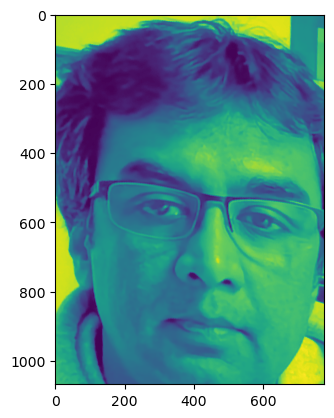

Magnitude of required change of A is: 40434.17190941345
Number of iterations: 9
3. img_warped input
img:
[[177 176 176 ... 127 128 128]
 [177 176 176 ... 127 127 128]
 [177 176 176 ... 127 127 127]
 ...
 [ 18  18  18 ...  45  46  47]
 [ 18  18  18 ...  45  46  47]
 [ 18  18  18 ...  45  46  47]]
<class 'numpy.ndarray'>
(1936, 2904)
A:
[[ 9.42092922e-01  4.43674289e-02  1.08662776e+03]
 [-1.46724677e-01  9.22298933e-01  1.33076333e+02]
 [ 7.24186570e-19 -8.97137908e-19  1.00000000e+00]]
<class 'numpy.ndarray'>
(3, 3)
output_size:
(1068, 777)
<class 'tuple'>
3. img_warped output
img_warped:
[[212. 213. 213. ...  71.  61.  62.]
 [212. 213. 213. ...  70.  70.  71.]
 [212. 213. 213. ...  81.  81.  81.]
 ...
 [ 94.  93.  94. ... 177. 179. 180.]
 [ 94.  93.  92. ... 178. 180. 180.]
 [ 94.  93.  91. ... 180. 180. 181.]]
<class 'numpy.ndarray'>
(1068, 777)
visualization for checking warpred function...


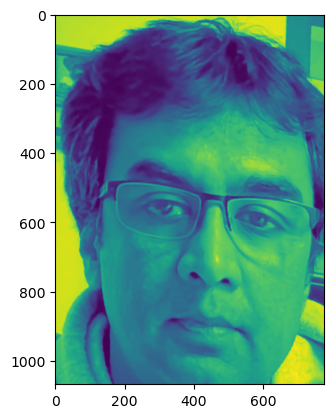

Magnitude of required change of A is: 41750.85987138469
Number of iterations: 10
3. img_warped input
img:
[[177 176 176 ... 127 128 128]
 [177 176 176 ... 127 127 128]
 [177 176 176 ... 127 127 127]
 ...
 [ 18  18  18 ...  45  46  47]
 [ 18  18  18 ...  45  46  47]
 [ 18  18  18 ...  45  46  47]]
<class 'numpy.ndarray'>
(1936, 2904)
A:
[[ 9.08082398e-01  3.83519985e-02  1.12017208e+03]
 [-1.42872867e-01  9.18395307e-01  1.32056127e+02]
 [ 6.99490956e-19 -8.96910881e-19  1.00000000e+00]]
<class 'numpy.ndarray'>
(3, 3)
output_size:
(1068, 777)
<class 'tuple'>
3. img_warped output
img_warped:
[[215. 215. 215. ...  89.  79.  78.]
 [215. 215. 215. ...  89.  91.  91.]
 [215. 215. 215. ...  97.  97.  96.]
 ...
 [165. 165. 165. ... 181. 189. 192.]
 [165. 165. 165. ... 181. 183. 186.]
 [165. 165. 165. ... 179. 180. 182.]]
<class 'numpy.ndarray'>
(1068, 777)
visualization for checking warpred function...


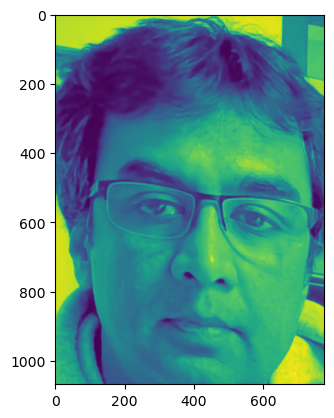

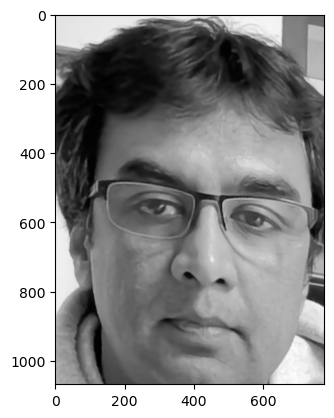

Magnitude of required change of A is: 40201.74720083693
Number of iterations: 11
4. Inverse Compositional Image Alignment output
refined A:
[[ 9.08082398e-01  3.83519985e-02  1.12017208e+03]
 [-1.42872867e-01  9.18395307e-01  1.32056127e+02]
 [ 6.99490956e-19 -8.96910881e-19  1.00000000e+00]]
<class 'numpy.ndarray'>
(3, 3)
3. img_warped input
img:
[[177 176 176 ... 127 128 128]
 [177 176 176 ... 127 127 128]
 [177 176 176 ... 127 127 127]
 ...
 [ 18  18  18 ...  45  46  47]
 [ 18  18  18 ...  45  46  47]
 [ 18  18  18 ...  45  46  47]]
<class 'numpy.ndarray'>
(1936, 2904)
A:
[[ 9.37761086e-01  2.10698689e-01  8.88832688e+02]
 [-2.38143347e-01  9.40170628e-01  1.89267407e+02]
 [ 8.13151629e-19 -8.13151629e-19  1.00000000e+00]]
<class 'numpy.ndarray'>
(3, 3)
output_size:
(1068, 777)
<class 'tuple'>
3. img_warped output
img_warped:
[[207. 207. 207. ... 229. 229. 229.]
 [207. 207. 207. ... 229. 229. 229.]
 [207. 207. 207. ... 229. 229. 229.]
 ...
 [182. 181. 181. ... 181. 181. 181.]
 [182.

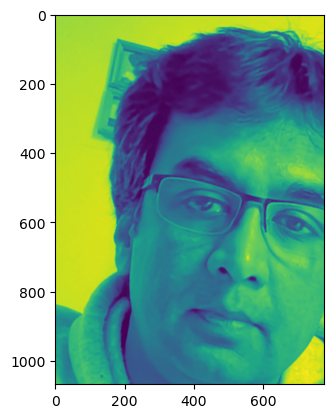

3. img_warped input
img:
[[177 176 176 ... 127 128 128]
 [177 176 176 ... 127 127 128]
 [177 176 176 ... 127 127 127]
 ...
 [ 18  18  18 ...  45  46  47]
 [ 18  18  18 ...  45  46  47]
 [ 18  18  18 ...  45  46  47]]
<class 'numpy.ndarray'>
(1936, 2904)
A:
[[ 9.08082398e-01  3.83519985e-02  1.12017208e+03]
 [-1.42872867e-01  9.18395307e-01  1.32056127e+02]
 [ 6.99490956e-19 -8.96910881e-19  1.00000000e+00]]
<class 'numpy.ndarray'>
(3, 3)
output_size:
(1068, 777)
<class 'tuple'>
3. img_warped output
img_warped:
[[215. 215. 215. ...  89.  79.  78.]
 [215. 215. 215. ...  89.  91.  91.]
 [215. 215. 215. ...  97.  97.  96.]
 ...
 [165. 165. 165. ... 181. 189. 192.]
 [165. 165. 165. ... 181. 183. 186.]
 [165. 165. 165. ... 179. 180. 182.]]
<class 'numpy.ndarray'>
(1068, 777)
visualization for checking warpred function...


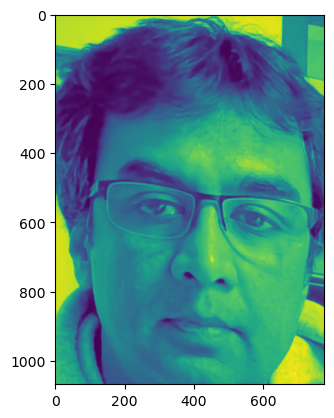

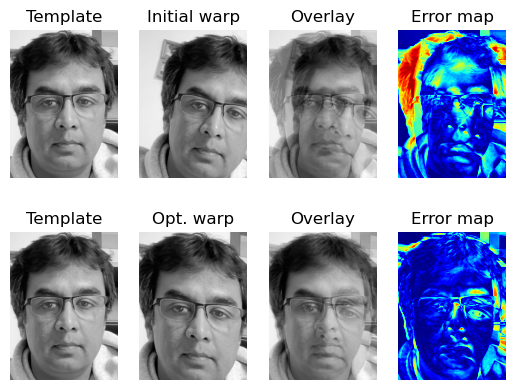

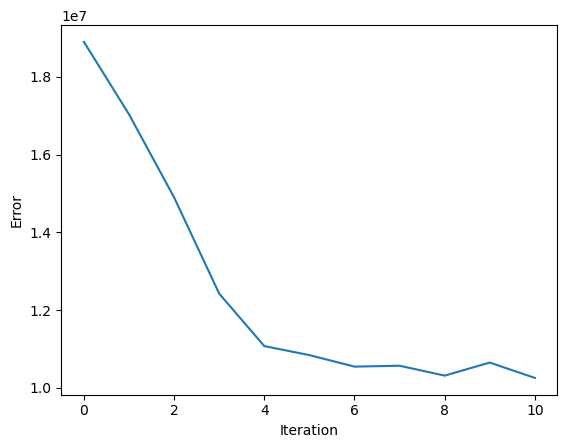

5. track_multi_frames output
A_list:
[array([[ 1.01204352e+00,  2.29118362e-01,  8.47481801e+02],
       [-2.54575195e-01,  9.40048848e-01,  1.98511791e+02],
       [ 8.75126016e-19, -8.01745407e-19,  1.00000000e+00]]), array([[ 7.84444915e-01, -1.19131257e-01,  1.25644176e+03],
       [-1.09699403e-01,  8.88882643e-01,  1.22582588e+02],
       [ 5.90502634e-19, -9.63810282e-19,  1.00000000e+00]]), array([[ 8.63462414e-01, -1.61685667e-01,  1.23837984e+03],
       [-6.79800807e-02,  9.56848142e-01,  6.20339546e+01],
       [ 5.97099318e-19, -1.05799406e-18,  1.00000000e+00]]), array([[ 9.08082398e-01,  3.83519985e-02,  1.12017208e+03],
       [-1.42872867e-01,  9.18395307e-01,  1.32056127e+02],
       [ 6.99490956e-19, -8.96910881e-19,  1.00000000e+00]])]
<class 'list'>
4


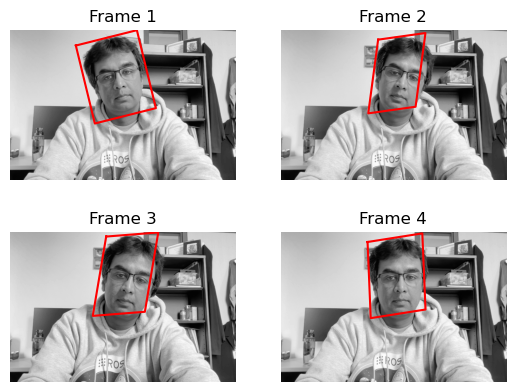

In [7]:
if __name__ == '__main__':
    template = cv2.imread('./JS_template.jpg', 0)  # read as grey scale image
    target_list = []
    for i in range(4):
        target = cv2.imread('./JS_target{}.jpg'.format(i+1), 0)  # read as grey scale image
        target_list.append(target)

    x1, x2 = find_match(template, target_list[0])
    visualize_find_match(template, target_list[0], x1, x2)

    ransac_thr = 150
    ransac_iter = 5

    A = align_image_using_feature(x1, x2, ransac_thr, ransac_iter)

    img_warped = warp_image(target_list[0], A, template.shape)
    plt.imshow(img_warped, cmap='gray', vmin=0, vmax=255)
    plt.axis('off')
    plt.show()

    A_refined, errors = align_image(template, target_list[0], A)
    visualize_align_image(template, target_list[0], A, A_refined, errors)

    A_list = track_multi_frames(template, target_list)
    visualize_track_multi_frames(template, target_list, A_list)